In [79]:
#reloading the client information
%load_ext autoreload
%autoreload 1
%aimport redditClient
# we are importing RedditProcessing.py and its contents
%aimport RedditProcessing

In [2]:
# Importing necessary packages
from redditClient import redditClient
import matplotlib.pyplot as plt
import praw
from collections import Counter
import json
import time
from datetime import datetime, timedelta
import string
import nltk
from langdetect import detect, DetectorFactory
import re
from wordcloud import WordCloud
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords
nltk.download('vader_lexicon')
nltk.download('stopwords')
from colorama import Fore, Back, Style
import pandas as pd
import numpy as np
import math
import codecs
import pyLDAvis
import pyLDAvis.lda_model

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/priyankatiwari/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/priyankatiwari/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [7]:
# subreddit name we interested in getting the hot submissions, in this case it's 'vegan'
sSubredditName = 'elonmusk'
# maximum number of hot submissions(posts)
hotLimit = 200

In [ ]:
'''import json
import praw

# Get Reddit client from reddit_client.py
reddit = redditClient()

# List of subreddits to search
subreddits = ['all', 'ElonMusk', 'SpaceX', 'technology', 'twitter', 'tesla', 'business']

# Initialize a list to hold all posts data
all_posts_data = []

# Maximum number of posts to retrieve across all subreddits
max_posts = 200
# Maximum number of comments per post
max_comments = 100

# Counter to track the number of posts
post_counter = 0

# Loop through each subreddit
for subreddit_name in subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    elon_posts = subreddit.search('Elon Musk', limit=200)

    # Extract relevant data for each post
    for post in elon_posts:
        if post_counter >= max_posts:
            break  # Stop collecting posts once the limit is reached

        # Extract post data
        comments_data = []
        comment_count = 0

        # Loop through comments, but limit the number of comments processed
        for comment in post.comments.list():
            if comment_count >= max_comments:
                break  # Stop collecting comments once the limit is reached
            if isinstance(comment, praw.models.Comment):
                comments_data.append({
                    'Comment': comment.body,
                    'Comment_Author': comment.author.name if comment.author else 'Unknown',
                    'Comment_Date': int(comment.created_utc)  # Add comment date as Unix timestamp
                })
                comment_count += 1

        # Add post and its comments
        all_posts_data.append({
            'Title': post.title,
            'Body': post.selftext if post.selftext else 'No text available',
            'author': post.author.name if post.author else 'Unknown',
            'score': post.score,
            'Comments': comments_data,
            'created': int(post.created_utc)  # Add post date as Unix timestamp
        })
        post_counter += 1

    if post_counter >= max_posts:
        break  # Stop searching subreddits if max_posts is reached

# Wrap the all_posts_data list inside a dictionary with "submission" key
output_data = {
    "submission": all_posts_data
}

# Save the extracted data as a JSON file
with open('data.json', 'w') as json_file:
    json.dump(output_data, json_file, indent=4)

print(f"Data saved to 'data.json' with {len(all_posts_data)} posts.") '''

In [28]:
'''import json
import praw

# Get Reddit client from reddit_client.py
reddit = redditClient()

# List of subreddits to search
subreddits = ['all']

# Initialize a list to hold all posts data
all_posts_data = []

# Maximum number of posts to retrieve across all subreddits
max_posts = 200
# Maximum number of comments per post
max_comments = 100

# Counter to track the number of posts
post_counter = 0

# Loop through each subreddit
for subreddit_name in subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    elon_posts = subreddit.search('Elon Musk', limit=200)

    # Extract relevant data for each post
    for post in elon_posts:
        if post_counter >= max_posts:
            break  # Stop collecting posts once the limit is reached

        # Extract post data
        comments_data = []
        comment_count = 0

        # Loop through comments, but limit the number of comments processed
        for comment in post.comments.list():
            if comment_count >= max_comments:
                break  # Stop collecting comments once the limit is reached
            if isinstance(comment, praw.models.Comment):
                comments_data.append({
                    'Comment': comment.body,
                    'Comment_Author': comment.author.name if comment.author else 'Unknown',
                    'Comment_Date': int(comment.created_utc)  # Add comment date as Unix timestamp
                })
                comment_count += 1

        # Add post and its comments
        all_posts_data.append({
            'Title': post.title,
            'Body': post.selftext if post.selftext else 'No text available',
            'author': post.author.name if post.author else 'Unknown',
            'score': post.score,
            'Comments': comments_data,
            'created': int(post.created_utc)  # Add post date as Unix timestamp
        })
        post_counter += 1

    if post_counter >= max_posts:
        break  # Stop searching subreddits if max_posts is reached

# Wrap the all_posts_data list inside a dictionary with "submission" key
output_data = {
    "submission": all_posts_data
}

# Save the extracted data as a JSON file
with open('elon_musk_data.json', 'w') as json_file:
    json.dump(output_data, json_file, indent=4)

print(f"Data saved to 'elon_musk_data.json' with {len(all_posts_data)} posts.") '''

Data saved to 'elon_musk_data.json' with 200 posts.


In [31]:
'''import json
import praw

# Get Reddit client from reddit_client.py
reddit = redditClient()

# List of subreddits to search
subreddits = ['all']

# Initialize a list to hold all posts data
all_posts_data = []

# Maximum number of posts to retrieve across all subreddits
max_posts = 200
# Maximum number of comments per post
max_comments = 100

# Counter to track the number of posts
post_counter = 0

# Loop through each subreddit
for subreddit_name in subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    elon_posts = subreddit.search('twitter', limit=200)

    # Extract relevant data for each post
    for post in elon_posts:
        if post_counter >= max_posts:
            break  # Stop collecting posts once the limit is reached

        # Extract post data
        comments_data = []
        comment_count = 0

        # Loop through comments, but limit the number of comments processed
        for comment in post.comments.list():
            if comment_count >= max_comments:
                break  # Stop collecting comments once the limit is reached
            if isinstance(comment, praw.models.Comment):
                comments_data.append({
                    'Comment': comment.body,
                    'Comment_Author': comment.author.name if comment.author else 'Unknown',
                    'Comment_Date': int(comment.created_utc)  # Add comment date as Unix timestamp
                })
                comment_count += 1

        # Add post and its comments
        all_posts_data.append({
            'Title': post.title,
            'Body': post.selftext if post.selftext else 'No text available',
            'author': post.author.name if post.author else 'Unknown',
            'score': post.score,
            'Comments': comments_data,
            'created': int(post.created_utc)  # Add post date as Unix timestamp
        })
        post_counter += 1

    if post_counter >= max_posts:
        break  # Stop searching subreddits if max_posts is reached

# Wrap the all_posts_data list inside a dictionary with "submission" key
output_data = {
    "submission": all_posts_data
}

# Save the extracted data as a JSON file
with open('twitter_data.json', 'w') as json_file:
    json.dump(output_data, json_file, indent=4)

print(f"Data saved to 'twitter_data.json' with {len(all_posts_data)} posts.") '''

Data saved to 'twitter_data.json' with 200 posts.


In [33]:
'''import json
import praw

# Get Reddit client from reddit_client.py
reddit = redditClient()

# List of subreddits to search
subreddits = ['all']

# Initialize a list to hold all posts data
all_posts_data = []

# Maximum number of posts to retrieve across all subreddits
max_posts = 200
# Maximum number of comments per post
max_comments = 100

# Counter to track the number of posts
post_counter = 0

# Loop through each subreddit
for subreddit_name in subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    elon_posts = subreddit.search('spacex', limit=200)

    # Extract relevant data for each post
    for post in elon_posts:
        if post_counter >= max_posts:
            break  # Stop collecting posts once the limit is reached

        # Extract post data
        comments_data = []
        comment_count = 0

        # Loop through comments, but limit the number of comments processed
        for comment in post.comments.list():
            if comment_count >= max_comments:
                break  # Stop collecting comments once the limit is reached
            if isinstance(comment, praw.models.Comment):
                comments_data.append({
                    'Comment': comment.body,
                    'Comment_Author': comment.author.name if comment.author else 'Unknown',
                    'Comment_Date': int(comment.created_utc)  # Add comment date as Unix timestamp
                })
                comment_count += 1

        # Add post and its comments
        all_posts_data.append({
            'Title': post.title,
            'Body': post.selftext if post.selftext else 'No text available',
            'author': post.author.name if post.author else 'Unknown',
            'score': post.score,
            'Comments': comments_data,
            'created': int(post.created_utc)  # Add post date as Unix timestamp
        })
        post_counter += 1

    if post_counter >= max_posts:
        break  # Stop searching subreddits if max_posts is reached

# Wrap the all_posts_data list inside a dictionary with "submission" key
output_data = {
    "submission": all_posts_data
}

# Save the extracted data as a JSON file
with open('spacex_data.json', 'w') as json_file:
    json.dump(output_data, json_file, indent=4)

print(f"Data saved to 'space_x_data.json' with {len(all_posts_data)} posts.") '''

Data saved to 'space_x_data.json' with 200 posts.


In [35]:
'''import json
import praw

# Get Reddit client from reddit_client.py
reddit = redditClient()

# List of subreddits to search
subreddits = ['all']

# Initialize a list to hold all posts data
all_posts_data = []

# Maximum number of posts to retrieve across all subreddits
max_posts = 200
# Maximum number of comments per post
max_comments = 100

# Counter to track the number of posts
post_counter = 0

# Loop through each subreddit
for subreddit_name in subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    elon_posts = subreddit.search('teslamotors', limit=200)

    # Extract relevant data for each post
    for post in elon_posts:
        if post_counter >= max_posts:
            break  # Stop collecting posts once the limit is reached

        # Extract post data
        comments_data = []
        comment_count = 0

        # Loop through comments, but limit the number of comments processed
        for comment in post.comments.list():
            if comment_count >= max_comments:
                break  # Stop collecting comments once the limit is reached
            if isinstance(comment, praw.models.Comment):
                comments_data.append({
                    'Comment': comment.body,
                    'Comment_Author': comment.author.name if comment.author else 'Unknown',
                    'Comment_Date': int(comment.created_utc)  # Add comment date as Unix timestamp
                })
                comment_count += 1

        # Add post and its comments
        all_posts_data.append({
            'Title': post.title,
            'Body': post.selftext if post.selftext else 'No text available',
            'author': post.author.name if post.author else 'Unknown',
            'score': post.score,
            'Comments': comments_data,
            'created': int(post.created_utc)  # Add post date as Unix timestamp
        })
        post_counter += 1

    if post_counter >= max_posts:
        break  # Stop searching subreddits if max_posts is reached

# Wrap the all_posts_data list inside a dictionary with "submission" key
output_data = {
    "submission": all_posts_data
}

# Save the extracted data as a JSON file
with open('tesla_data.json', 'w') as json_file:
    json.dump(output_data, json_file, indent=4)

print(f"Data saved to 'tesla_data.json' with {len(all_posts_data)} posts.") '''

Data saved to 'tesla_data.json' with 200 posts.


In [119]:
'''import json

# Load the JSON files
with open('data.json') as f:
    data0 = json.load(f)
with open('elon_musk_data.json') as f:
    data1 = json.load(f)

with open('twitter_data.json') as f:
    data2 = json.load(f)

with open('SpaceX_data.json') as f:
    data3 = json.load(f)

with open('Tesla_data.json') as f:
    data4 = json.load(f)

# Initialize a list to hold all submissions
finaljson = {"submission": []}

# Function to safely append submissions from a data source
def append_submissions(source_data, key):
    if key in source_data:
        items = source_data[key]
        if isinstance(items, list):
            finaljson["submission"].extend(items)  # Add all items to the final list
        else:
            print(f"Warning: {key} in data is not a list.")
    else:
        print(f"Warning: Key '{key}' not found in data.")

# Append submissions from each data source
append_submissions(data0, "submission")
append_submissions(data1, "submission")  # Adjust the key based on the structure of elon_musk_data.json
append_submissions(data2, "submission")
append_submissions(data3, "submission")
append_submissions(data4, "submission")



# Write the merged JSON to a file
with open('merged_json.json', "w") as f:
    f.write(json.dumps(finaljson, indent=2))'''


## Data Pre-Processing

In [121]:
import json
import nltk
import re
from collections import Counter
import string
from langdetect import detect  # Ensure you have langdetect installed


# Load the JSON file
fJsonName = 'merged_json.json'
# Number of most frequent terms to display
freqNum = 50

# Tweet tokenizer to use
tweetTokeniser = nltk.tokenize.TweetTokenizer()

# Use the punctuation symbols defined in string.punctuation
lPunct = list(string.punctuation)

# Use stopwords from nltk and a few other Twitter-specific terms like 'rt' (retweet)
lStopwords = nltk.corpus.stopwords.words('english') + lPunct + ['via']

# Our term frequency counter
termFreqCounter = Counter()

# List to store all tokens
lTokens = []

def is_english(text):
    try:
        # Detect the language of the text
        lang = detect(text)
        # Return True if the detected language is English
        return lang == 'en'
    except:
        # If detection fails, assume it's not English
        return False

def processText(text, tokenzer, stopwords):
    """Tokenizes, cleans, and filters the given text without stemming."""
    # Tokenize the text
    tokens = tokenzer.tokenize(text)
    # Remove punctuation and non-alphabetic characters
    tokens = [re.sub(r'[^a-zA-Z]', '', token) for token in tokens]
    # Remove empty strings (resulting from removal of all characters)
    tokens = [token for token in tokens if token]
    # Lowercase and remove stopwords
    tokens = [token.lower() for token in tokens if token.lower() not in stopwords]
    return tokens

def process_submission_text(text, tokenzer, stopwords, lTokens, termFreqCounter):
    """Processes a single text item (submission or comment), updates tokens and term frequency."""
    if is_english(text):
        tokens = processText(text, tokenzer, stopwords)
        lTokens.extend(tokens)
        termFreqCounter.update(tokens)

# Open JSON file and process it
with open(fJsonName, 'r') as f:
    dSubmissions = json.load(f)
    
    # Process posts and comments in one pass
    for submission in dSubmissions['submission']:
        # Process submission body
        process_submission_text(submission.get('Body', ''), tweetTokeniser, lStopwords, lTokens, termFreqCounter)

        # Process comments
        for comment in submission.get('Comments', []):
            process_submission_text(comment.get('Comment', ''), tweetTokeniser, lStopwords, lTokens, termFreqCounter)

# Print out most common terms
for term, count in termFreqCounter.most_common(freqNum):
    print(f'{term}: {count}')

# Optionally, print the first few tokens to verify
print(f'First 10 tokens: {lTokens[:10]}')


like: 12346
elon: 9899
people: 9721
would: 7432
musk: 7234
one: 6854
tesla: 6773
get: 6399
twitter: 6094
even: 4811
time: 4592
space: 4330
think: 4327
dont: 4217
going: 4117
trump: 4026
see: 4018
really: 3878
still: 3751
know: 3722
make: 3562
im: 3560
much: 3558
r: 3454
right: 3430
good: 3393
last: 3332
also: 3322
spacex: 3208
hes: 3205
shit: 3199
could: 3183
way: 3169
car: 3143
go: 3046
money: 2997
want: 2968
company: 2889
x: 2871
back: 2830
years: 2813
comments: 2801
us: 2773
never: 2760
thing: 2714
need: 2689
something: 2685
well: 2557
got: 2514
actually: 2473
First 10 tokens: ['looks', 'like', 'post', 'politics', 'various', 'methods', 'filtering', 'content', 'relating', 'politics']


/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


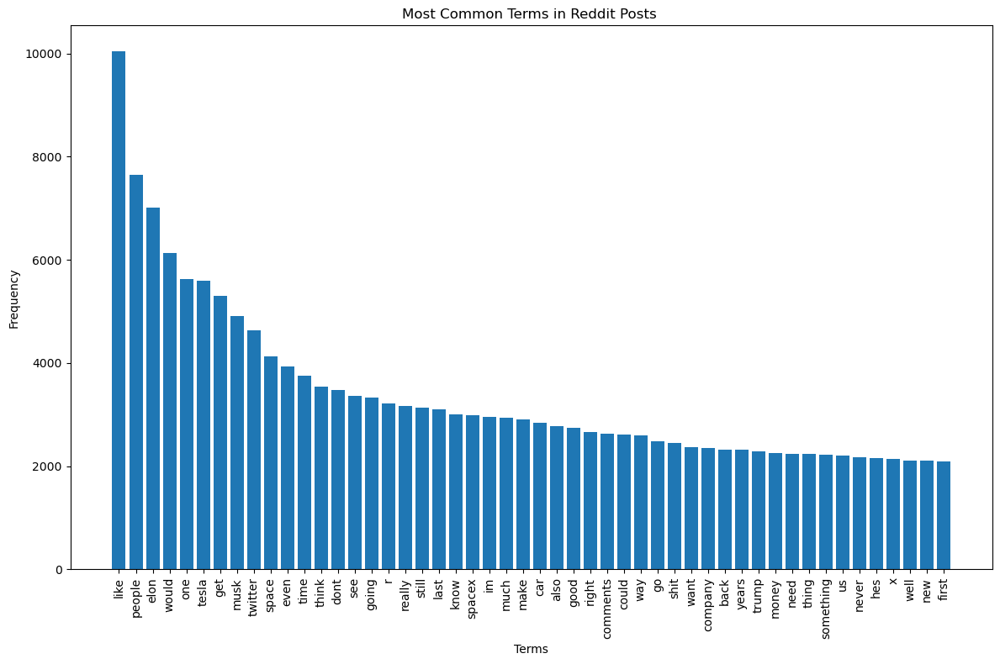

In [101]:
#Plot a bar chart of the most common terms
terms, counts = zip(*termFreqCounter.most_common(freqNum))
plt.figure(figsize=(12, 8))
plt.bar(terms, counts)
plt.xlabel('Terms')
plt.ylabel('Frequency')
plt.title('Most Common Terms in Reddit Posts ')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

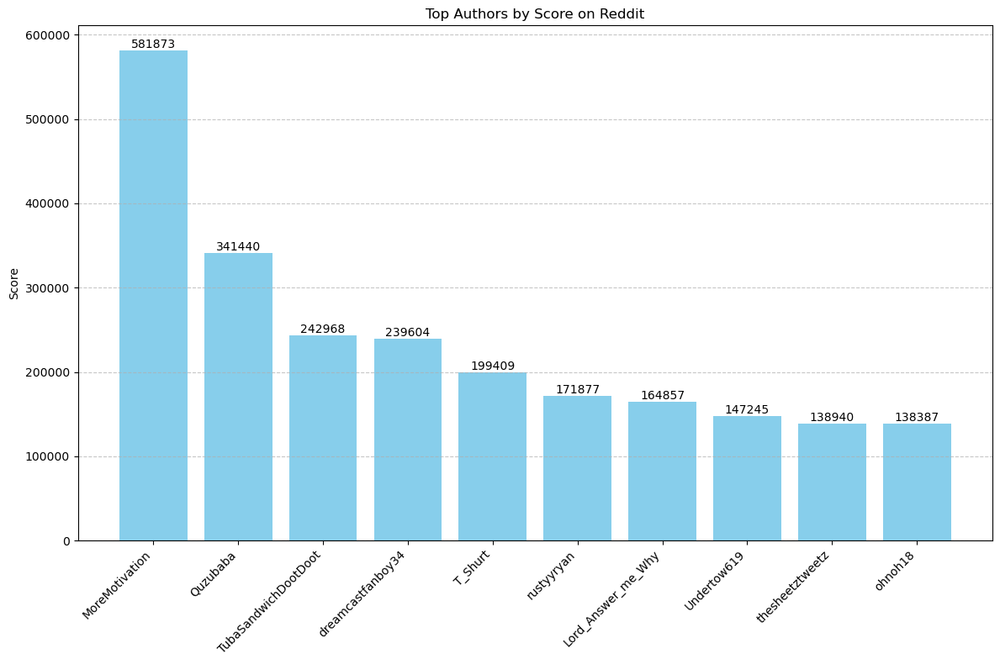

In [1]:
import json
import matplotlib.pyplot as plt
import pandas as pd

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Get the top authors based on score
def get_top_authors(data, top_n=10):
    # Create a DataFrame for easy sorting and manipulation
    df = pd.DataFrame(data)
    
    # Group by author and sum their scores
    author_scores = df.groupby('author')['score'].sum().reset_index()
    
    # Sort by score and get the top N authors
    top_authors = author_scores.nlargest(top_n, 'score')
    return top_authors

# Visualize the top authors with their scores
def visualize_top_authors(top_authors):
    plt.figure(figsize=(12, 8))

    # Create a bar plot
    bars = plt.bar(top_authors['author'], top_authors['score'], color='skyblue')

    # Add score as labels on top of the bars
    for bar in bars:
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), bar.get_height(),
                 ha='center', va='bottom', fontsize=10)

    plt.ylabel('Score')
    plt.title('Top Authors by Score on Reddit')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
    plt.tight_layout()  # Adjust layout to prevent clipping
    plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for better readability
    plt.show()

# File path to your JSON file
file_path = "merged_json.json"

# Load the data
data = load_data(file_path)

# Get the top authors
top_authors = get_top_authors(data, top_n=10)  # Change 'top_n' for the desired number of top authors

# Visualize the top authors with their scores
visualize_top_authors(top_authors)


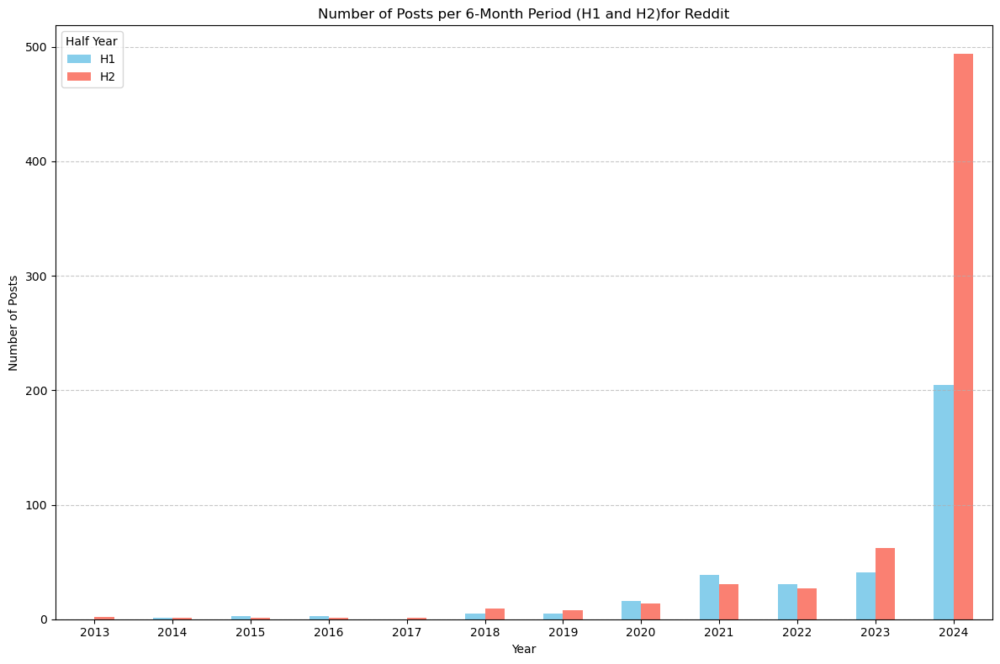

In [2]:
import json
import matplotlib.pyplot as plt
import pandas as pd

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Get the number of posts for each 6-month period
def get_post_counts_by_half_year(data):
    # Create a DataFrame for easy date manipulation
    df = pd.DataFrame(data)

    # Convert 'created' timestamps to datetime format
    df['created'] = pd.to_datetime(df['created'], unit='s')

    # Extract year and half-year (H1/H2)
    df['Year'] = df['created'].dt.year
    df['Half'] = df['created'].dt.month.apply(lambda x: 'H1' if x <= 6 else 'H2')

    # Group by year and half-year and count posts
    post_counts = df.groupby(['Year', 'Half']).size().reset_index(name='Post Count')
    
    return post_counts

# Visualize the number of posts by half-year
def visualize_post_counts(post_counts):
    # Create a pivot table for better visualization
    pivot = post_counts.pivot(index='Year', columns='Half', values='Post Count').fillna(0)

    # Create a bar plot
    pivot.plot(kind='bar', figsize=(12, 8), color=['skyblue', 'salmon'])
    
    plt.title('Number of Posts per 6-Month Period (H1 and H2)for Reddit')
    plt.ylabel('Number of Posts')
    plt.xlabel('Year')
    plt.xticks(rotation=0)  # Keep x labels horizontal
    plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for better readability
    plt.legend(title='Half Year')
    plt.tight_layout()  # Adjust layout to prevent clipping
    plt.show()

# File path to your JSON file
file_path = "merged_json.json"

# Load the data
data = load_data(file_path)

# Get post counts by half-year
post_counts = get_post_counts_by_half_year(data)

# Visualize the number of posts by half-year
visualize_post_counts(post_counts)


## VADER Sentiment Analysis

In [103]:
def vaderPrintTokens(lTokens, dSentimentScores):
    """Prints tokens and their corresponding sentiment scores."""
    
    # Print tokens
    print('Tokens:', ', '.join(lTokens))
    
    # Print sentiment scores
    print('Sentiment Scores:')
    for cat, score in dSentimentScores.items():
        print(f'{cat}: {score}', end=', ')
    print()

In [105]:
def vaderSentimentAnalysis(sTweetsFilename, bPrint, tweetProcessor):

    # this is the vader sentiment analyser, part of nltk
    sentAnalyser = SentimentIntensityAnalyzer()


    lSentiment = []
    # open file and process tweets, one by one
    with open(sTweetsFilename, 'r') as f:
        redditDump = json.load(f)
        
        for submission in redditDump['submission']:
            postText = submission['Title']
            postDate = submission['created']
            
            # pre-process the post text
            lTokens = redditProcessor.process(postText)

            # this computes the sentiment scores (called polarity score in nltk, but mean same thing essentially)
            # see workshop sheet for what dSentimentScores holds
            dSentimentScores = sentAnalyser.polarity_scores(" ".join(lTokens))

            # save the date and sentiment of each post (used for time series)
            lSentiment.append([pd.to_datetime(postDate, unit='s'), dSentimentScores['compound']])

            # if we are printing, we print the tokens then the sentiment scores.  Because we don't have the list
            # of positive and negative words, we cannot use colorama to label each token
            if bPrint:
                vaderPrintTokens(lTokens, dSentimentScores)
                
                
            # process the comments
            for comment in submission['Comments']:
                postText = comment['Comment']
                postDate = comment['Comment_Date']
                
                # pre-process the post text
                lTokens = redditProcessor.process(postText)

                # this computes the sentiment scores (called polarity score in nltk, but mean same thing essentially)
                # see workshop sheet for what dSentimentScores holds
                dSentimentScores = sentAnalyser.polarity_scores(" ".join(lTokens))

                # save the date and sentiment of each post (used for time series)
                lSentiment.append([pd.to_datetime(postDate, unit='s'), dSentimentScores['compound']])

               
                if bPrint:
                    vaderPrintTokens(lTokens, dSentimentScores)
                    
                    
    return lSentiment

In [107]:
# input file of set of reddit posts
redditFile = 'merged_json.json'
flagPrint = True
approach = "vader"

In [109]:
# construct the reddit pro-processing object
# use tweet tokenizer
tweetTokenizer = TweetTokenizer()
lPunct = list(string.punctuation)
# standard 'English' stopwords plus we want to remove things like 'rt' (retweet) etc
lStopwords = stopwords.words('english') + lPunct + ['rt', 'via', '...', '…', '"', "'", '`']

# call the RedditProcessing python script
redditProcessor = RedditProcessing.RedditProcessing(tweetTokenizer, lStopwords)

In [111]:
# compute the sentiment
lSentiment = []
if approach == 'vader':
    lSentiment = vaderSentimentAnalysis(redditFile, flagPrint, redditProcessor)


Tokens: elon, musk, shaking, hands, donald, trump, rally, butler, pennsylvania
Sentiment Scores:
neg: 0.175, neu: 0.825, pos: 0.0, compound: -0.1779, 
Tokens: looks, like, post, politics, various, methods, filtering, content, relating, politics, found, bot, action, performed, automatically, please, contact, moderators, subreddit, message, compose, =/, r, pics, questions, concerns
Sentiment Scores:
neg: 0.082, neu: 0.753, pos: 0.164, compound: 0.34, 
Tokens: ’, ketamine, gremlin
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: name, reek
Sentiment Scores:
neg: 0.773, neu: 0.227, pos: 0.0, compound: -0.5267, 
Tokens: paypalpatine
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: maybe, looks, exactly, like, rudy, giuliani
Sentiment Scores:
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.3612, 
Tokens: gif, giphy, ayjfdmmgs, 7oku, downsized
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: edgar, skin, hanging, bones
Sentime

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Tokens: honestly, know, people, quit, migrated, different, platform, using, twitter, supporting, asshole, everyone, like, elon, left, twitter, would, become, 8chan, wasteland, valued, 50k, would, something
Sentiment Scores:
neg: 0.0, neu: 0.639, pos: 0.361, compound: 0.8834, 
Tokens: guys, still, use, twitter
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: since, elon, brought, twitter, i've, getting, notification, every, time, andrew, tate, posts, something, used, twitter, look, art, app, banned, finally, know, peace, ☺, ️
Sentiment Scores:
neg: 0.113, neu: 0.755, pos: 0.132, compound: 0.128, 
Tokens: think, everyone, gets, served, right, wing, content, twitter
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: created, new, account, work, quickly, decided, ’, worth, especially, since, ’, allow, post, definitely, much, right, wing, trash, elon, shit, shoved, timeline
Sentiment Scores:
neg: 0.131, neu: 0.548, pos: 0.321, compound: 0.4902, 
T

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Tokens: remember, heard, going, rockets, land, vertically, thought, crazy, would, hard, thought, realized, going, land, mars, atmosphere, thin, parachutes, airplane, like, landing, would, land, like, plane, amazing, see
Sentiment Scores:
neg: 0.11, neu: 0.636, pos: 0.254, compound: 0.7184, 
Tokens: what's, funny, thought, 20-50, years, we're, going, look, back, like, look, back, steve, jobs, presenting, touchscreen, phone, going, funny, impressed, something, common
Sentiment Scores:
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.886, 
Tokens: goddamn, hope, humanity, alright, incredible
Sentiment Scores:
neg: 0.31, neu: 0.2, pos: 0.49, compound: 0.2023, 
Tokens: gif, giphy, 26fpt1fg0ioyir35c
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: saw, taking, house, morning, idea, happening, windows, shaking, super, loud, went, look, outside, see, close, tornado, saw, first, thought, aliens
Sentiment Scores:
neg: 0.072, neu: 0.763, pos: 0.165, compound: 0.4939, 
Tokens: 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Tokens: comes, much, anticipated, left, wing, smear, campaign, ah, yes, well-known, leftist, media, outlet, business, insider
Sentiment Scores:
neg: 0.137, neu: 0.714, pos: 0.148, compound: 0.0516, 
Tokens: let, ’, see, long, elon, fanboys, raid, thread
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: great, day, subreddit, drama
Sentiment Scores:
neg: 0.0, neu: 0.423, pos: 0.577, compound: 0.6249, 
Tokens: ’, definitely, “, believe, women, ”, camp, instantly, assumes, guilt, well, good, thing, “, believe, women, ”, means, ’, instantly, assume, innocence, take, sexual, assault, allegations, seriously, people, like, always, assume, rich, senpai, innocent
Sentiment Scores:
neg: 0.171, neu: 0.405, pos: 0.423, compound: 0.8807, 
Tokens: deleted
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: let, get, right, asked, comment, article, day, switches, r, foresee's, political, attack, asking, people, see, accusations, political, lense, that's, lite

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Tokens: 12volt, dies, use, en, external, battery, source, open, hood, could, connect, external, power, 12, volt, battery, open, doors
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: read, model, rescue, sheet, says, “, knee, airbags, installed, north, america, mexico, ”, ’, mexico, part, north, america
Sentiment Scores:
neg: 0.0, neu: 0.809, pos: 0.191, compound: 0.5106, 
Tokens: tell, us, ’, want, read
Sentiment Scores:
neg: 0.0, neu: 0.698, pos: 0.302, compound: 0.0772, 
Tokens: always, frunk
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: cool, important, thanks, sharing
Sentiment Scores:
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.8316, 
Tokens: read, hope, never, need, thank
Sentiment Scores:
neg: 0.263, neu: 0.375, pos: 0.362, compound: 0.1999, 
Tokens: duh
Sentiment Scores:
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
Tokens: thanks, op, cool, love, seeing, details, car, hope, comes, handy, first, responders, new, old, owners, never

Total Positive Score: 17322.699
Total Negative Score: 14858.07
Total Compound Score: 3878.5041


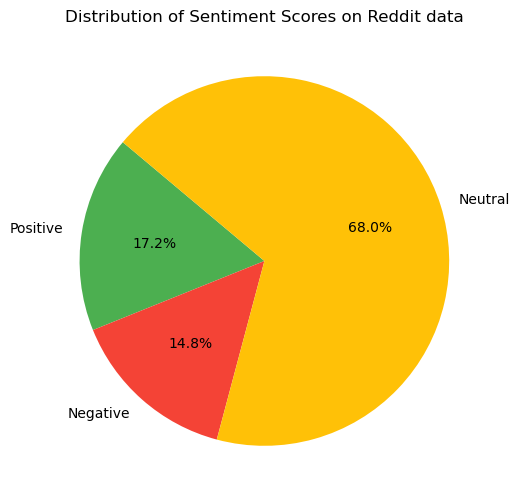

In [65]:
import json
import pandas as pd
import string
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.tokenize import TweetTokenizer

# Class for processing Reddit text
class RedditProcessing:
    def __init__(self, tokenizer, stopwords):
        self.tokenizer = tokenizer
        self.stopwords = stopwords

    def process(self, text):
        """Tokenizes and removes stopwords."""
        tokens = self.tokenizer.tokenize(text.lower())
        return [token for token in tokens if token not in self.stopwords]

def vaderSentimentAnalysis(sTweetsFilename, tweetProcessor):
    """Performs VADER sentiment analysis on Reddit posts."""
    sentAnalyser = SentimentIntensityAnalyzer()
    sentiment_data = []

    with open(sTweetsFilename, 'r') as f:
        redditDump = json.load(f)

        for submission in redditDump['submission']:
            # Analyze post title
            postText = submission['Title']
            postDate = submission['created']
            lTokens = tweetProcessor.process(postText)
            dSentimentScores = sentAnalyser.polarity_scores(" ".join(lTokens))
            sentiment_data.append([pd.to_datetime(postDate, unit='s'), 
                                   dSentimentScores['pos'], 
                                   dSentimentScores['neg'], 
                                   dSentimentScores['compound']])

            # Analyze comments
            for comment in submission['Comments']:
                commentText = comment['Comment']
                commentDate = comment['Comment_Date']
                lTokens = tweetProcessor.process(commentText)
                dSentimentScores = sentAnalyser.polarity_scores(" ".join(lTokens))
                sentiment_data.append([pd.to_datetime(commentDate, unit='s'), 
                                       dSentimentScores['pos'], 
                                       dSentimentScores['neg'], 
                                       dSentimentScores['compound']])

    # Convert to DataFrame
    df_sentiment = pd.DataFrame(sentiment_data, columns=['Date', 'Positive', 'Negative', 'Compound'])
    return df_sentiment

# Input configuration
redditFile = 'merged_json.json'

# Tokenizer and stopwords setup
tweetTokenizer = TweetTokenizer()
punctuation = list(string.punctuation)
stopwords_list = stopwords.words('english') + punctuation + ['rt', 'via', '...', '…', '"', "'", '`']

# Initialize RedditProcessing
redditProcessor = RedditProcessing(tweetTokenizer, stopwords_list)

# Perform sentiment analysis and get DataFrame
df_sentiment = vaderSentimentAnalysis(redditFile, redditProcessor)

# Aggregated sentiment scores
total_positive = df_sentiment['Positive'].sum()
total_negative = df_sentiment['Negative'].sum()
total_compound = df_sentiment['Compound'].sum()

# Print aggregated scores
print(f"Total Positive Score: {total_positive}")
print(f"Total Negative Score: {total_negative}")
print(f"Total Compound Score: {total_compound}")


# Pie chart for total positive, negative, and neutral scores
labels = ['Positive', 'Negative', 'Neutral']
sizes = [total_positive, total_negative, len(df_sentiment) - total_positive - total_negative]
colors = ['#4CAF50', '#F44336', '#FFC107']

plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Sentiment Scores on Reddit data')
plt.show()


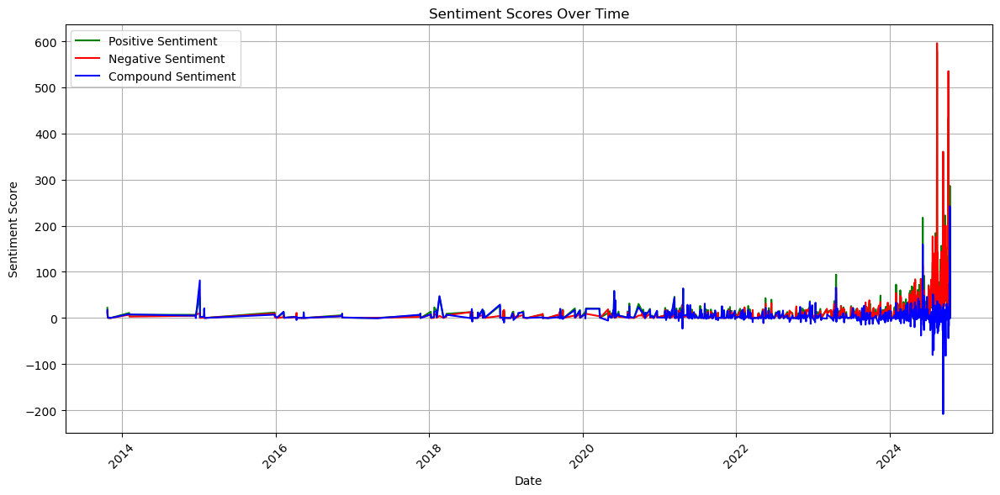

In [71]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Ensure the 'Date' column is in datetime format
df_sentiment['Date'] = pd.to_datetime(df_sentiment['Date'])

# Step 2: Group by date and sum only sentiment score columns
df_time_series = df_sentiment.groupby(df_sentiment['Date'].dt.date).agg({
    'Positive': 'sum',
    'Negative': 'sum',
    'Compound': 'sum'
}).reset_index()

# Step 3: Rename the 'Date' column for clarity
df_time_series.rename(columns={'Date': 'Date'}, inplace=True)

# Step 4: Plotting the time series data
plt.figure(figsize=(12, 6))
plt.plot(df_time_series['Date'], df_time_series['Positive'], label='Positive Sentiment', color='green')
plt.plot(df_time_series['Date'], df_time_series['Negative'], label='Negative Sentiment', color='red')
plt.plot(df_time_series['Date'], df_time_series['Compound'], label='Compound Sentiment', color='blue')

# Adding titles and labels
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.tight_layout()

# Show the plot
plt.show()


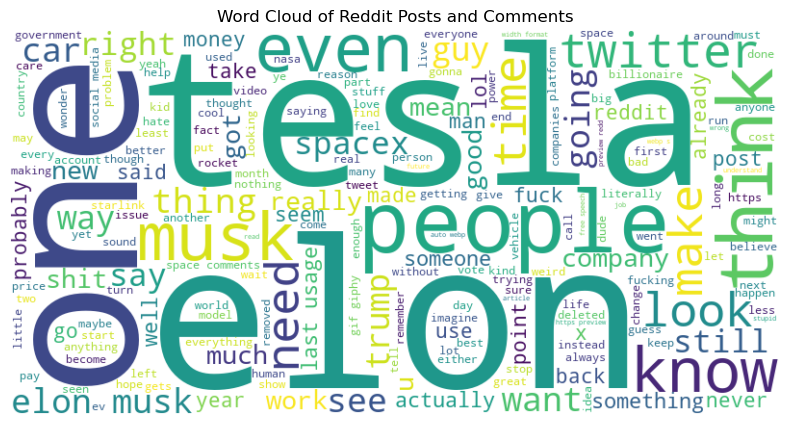

In [123]:
from wordcloud import WordCloud

# Collect all tokens from posts and comments into a single list
all_tokens = []

with open(redditFile, 'r') as f:
    redditDump = json.load(f)

    for submission in redditDump['submission']:
        # Tokens from post titles
        postText = submission['Title']
        lTokens = redditProcessor.process(postText)
        all_tokens.extend(lTokens)

        # Tokens from comments
        for comment in submission['Comments']:
            commentText = comment['Comment']
            lTokens = redditProcessor.process(commentText)
            all_tokens.extend(lTokens)

# Join all tokens into a single string
text_for_wordcloud = " ".join(all_tokens)

# Generate the Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(text_for_wordcloud)

# Display the Word Cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Word Cloud of Reddit Posts and Comments')
plt.show()


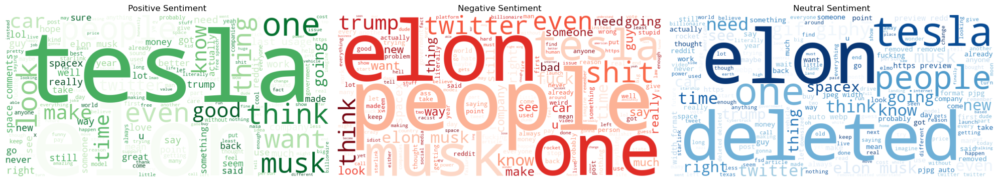

In [126]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Helper function to generate word cloud
def generate_word_cloud(tokens, colormap):
    text = " ".join(tokens)
    return WordCloud(width=800, height=400, background_color='white', colormap=colormap).generate(text)

# Generate word clouds for each sentiment
positive_wc = generate_word_cloud(positive_tokens, 'Greens')
negative_wc = generate_word_cloud(negative_tokens, 'Reds')
neutral_wc = generate_word_cloud(neutral_tokens, 'Blues')

# Plot the word clouds side by side
fig, axes = plt.subplots(1, 3, figsize=(20, 8))  # 1 row, 3 columns

# Display each word cloud
axes[0].imshow(positive_wc, interpolation='bilinear')
axes[0].axis('off')
axes[0].set_title('Positive Sentiment(Reddit data)')

axes[1].imshow(negative_wc, interpolation='bilinear')
axes[1].axis('off')
axes[1].set_title('Negative Sentiment(Reddit data)')

axes[2].imshow(neutral_wc, interpolation='bilinear')
axes[2].axis('off')
axes[2].set_title('Neutral Sentiment(Reddit data)')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


Sample Sentiment Values:
                 date  compound
0 2024-10-06 01:46:34   -0.1779
1 2024-10-06 01:46:36    0.5859
2 2024-10-06 03:10:50    0.0000
3 2024-10-06 02:35:37   -0.5267
4 2024-10-06 02:03:29    0.0000
Sample Average Sentiment:
         date  compound
0  2013-10-23  0.090149
1  2013-10-24 -0.027145
2  2013-10-26  0.630600
3  2013-11-08  0.000000
4  2014-02-04  0.098258
Compound Score Range: min=-0.9265, max=0.9432


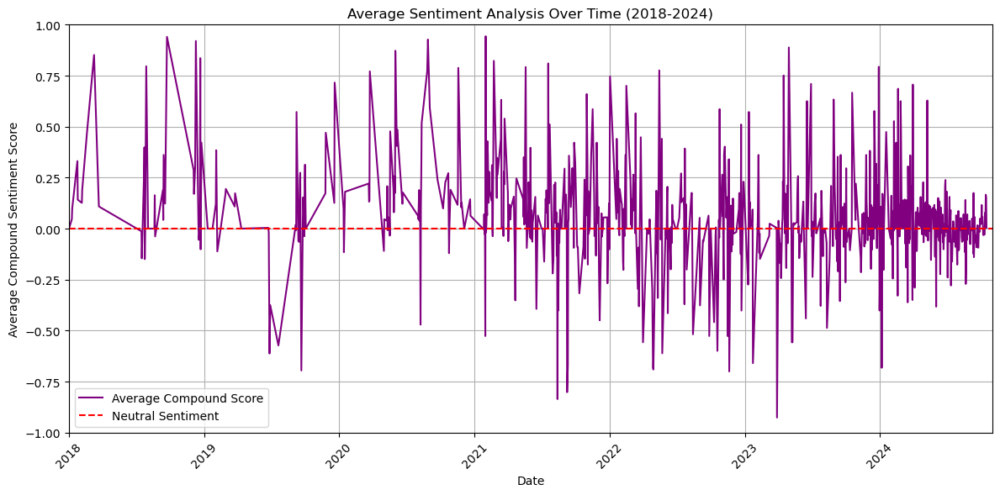

In [134]:
'''import json
import pandas as pd
import numpy as np
from datetime import datetime
from scipy.interpolate import make_interp_spline
import matplotlib.pyplot as plt
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Load data from JSON
with open('merged_json.json', 'r', encoding='utf-8') as f:
    data = json.load(f)

# Verify the data format
if isinstance(data['submission'], list):
    sentiment_analyzer = SentimentIntensityAnalyzer()
    sentiment_scores = []

    # Loop through submissions and extract sentiment scores
    for submission in data['submission']:
        posted_date = pd.to_datetime(submission['created'], unit='s')  # Convert Unix timestamp to datetime

        # Analyze post title
        title_score = sentiment_analyzer.polarity_scores(submission['Title'])
        sentiment_scores.append([posted_date, title_score['compound']])

        # Analyze comments
        for comment in submission['Comments']:
            comment_date = pd.to_datetime(comment['Comment_Date'], unit='s')  # Convert comment timestamp
            comment_score = sentiment_analyzer.polarity_scores(comment['Comment'])
            sentiment_scores.append([comment_date, comment_score['compound']])

    # Convert to DataFrame
    sentiment_df = pd.DataFrame(sentiment_scores, columns=['date', 'compound'])

    # Debugging Step: Check if sentiment values are valid
    print("Sample Sentiment Values:")
    print(sentiment_df.head())

    # Group by date and calculate average sentiment
    avg_sentiment = sentiment_df.groupby(sentiment_df['date'].dt.date)['compound'].mean().reset_index()

    # Debugging Step: Check average sentiment values
    print("Sample Average Sentiment:")
    print(avg_sentiment.head())

    # Convert date back to datetime for plotting
    avg_sentiment['date'] = pd.to_datetime(avg_sentiment['date'])

    # Prepare data for spline interpolation
    x = avg_sentiment['date'].map(datetime.timestamp).to_numpy()  # Convert to timestamps
    y = avg_sentiment['compound'].to_numpy()

    # Debugging Step: Check range of compound scores
    print(f"Compound Score Range: min={y.min()}, max={y.max()}")

    # Create a smooth spline curve
    x_spline = np.linspace(x.min(), x.max(), 500)  # 500 points for smooth curve
    spline = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
    y_spline = spline(x_spline)

    # Convert timestamps back to dates for plotting
    x_spline_dates = pd.to_datetime(x_spline, unit='s')

    # Plot raw average sentiment values over time
    plt.figure(figsize=(12, 6))
    plt.plot(avg_sentiment['date'], avg_sentiment['compound'], marker='', linestyle='-', color='purple', label='Average Compound Score')
    plt.axhline(0, color='red', linestyle='--', label='Neutral Sentiment')  # Neutral sentiment line
    plt.title('Average Sentiment Analysis Over Time (2018-2024)')
    plt.xlabel('Date')
    plt.ylabel('Average Compound Sentiment Score')
    plt.xlim(pd.to_datetime('2018-01-01'), pd.to_datetime('2024-10-31'))  # Limit x-axis
    plt.xticks(rotation=45)
    plt.ylim(-1, 1)  # Set y-axis limits to ensure correct scaling
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()


else:
    print("Unexpected data format in JSON file. Expected a list of submissions.")'''


Sample Sentiment Values:
                 date  compound
0 2024-10-06 01:46:34   -0.1779
1 2024-10-06 01:46:36    0.5859
2 2024-10-06 03:10:50    0.0000
3 2024-10-06 02:35:37   -0.5267
4 2024-10-06 02:03:29    0.0000
Sample Average Sentiment (15-day intervals):
  15_day_interval  compound
0      2013-10-23  0.090149
1      2013-10-24 -0.027145
2      2013-10-26  0.630600
3      2013-11-08  0.000000
4      2014-02-04  0.098258
Compound Score Range: min=-0.9265, max=0.9432


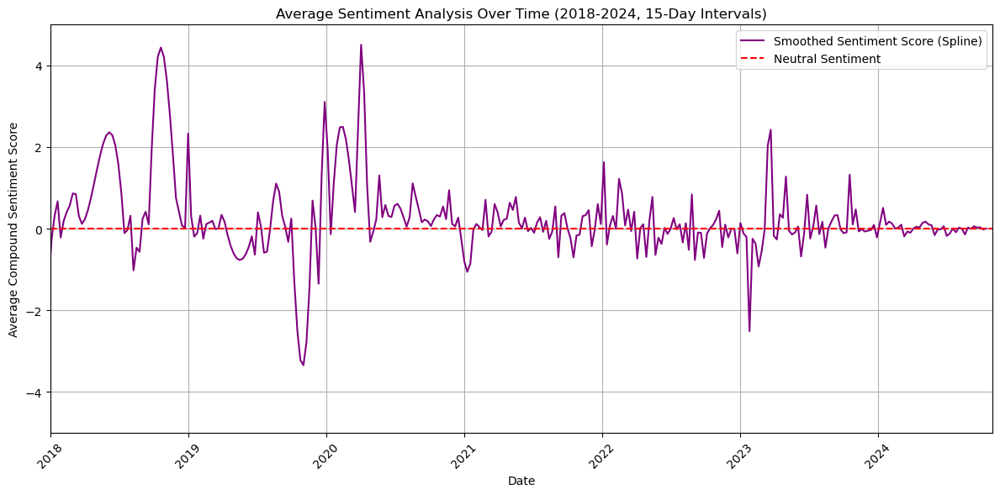

In [19]:
import json
import pandas as pd
import numpy as np
from datetime import datetime
from scipy.interpolate import make_interp_spline
import matplotlib.pyplot as plt
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Load data from JSON
with open('merged_json.json', 'r', encoding='utf-8') as f:
    data = json.load(f)

# Verify the data format
if isinstance(data['submission'], list):
    sentiment_analyzer = SentimentIntensityAnalyzer()
    sentiment_scores = []

    # Loop through submissions and extract sentiment scores
    for submission in data['submission']:
        posted_date = pd.to_datetime(submission['created'], unit='s')  # Convert Unix timestamp to datetime

        # Analyze post title
        title_score = sentiment_analyzer.polarity_scores(submission['Title'])
        sentiment_scores.append([posted_date, title_score['compound']])

        # Analyze comments
        for comment in submission['Comments']:
            comment_date = pd.to_datetime(comment['Comment_Date'], unit='s')  # Convert comment timestamp
            comment_score = sentiment_analyzer.polarity_scores(comment['Comment'])
            sentiment_scores.append([comment_date, comment_score['compound']])

    # Convert to DataFrame
    sentiment_df = pd.DataFrame(sentiment_scores, columns=['date', 'compound'])

    # Debugging Step: Check if sentiment values are valid
    print("Sample Sentiment Values:")
    print(sentiment_df.head())

    # Group by 15-day intervals and calculate average sentiment
    sentiment_df['15_day_interval'] = sentiment_df['date'].dt.to_period('30D').apply(lambda r: r.start_time)
    avg_sentiment = sentiment_df.groupby('15_day_interval')['compound'].mean().reset_index()

    # Debugging Step: Check average sentiment values
    print("Sample Average Sentiment (15-day intervals):")
    print(avg_sentiment.head())

    # Convert interval back to datetime for plotting
    avg_sentiment['15_day_interval'] = pd.to_datetime(avg_sentiment['15_day_interval'])

    # Prepare data for spline interpolation
    x = avg_sentiment['15_day_interval'].map(datetime.timestamp).to_numpy()  # Convert to timestamps
    y = avg_sentiment['compound'].to_numpy()

    # Debugging Step: Check range of compound scores
    print(f"Compound Score Range: min={y.min()}, max={y.max()}")

    # Create a smooth spline curve
    x_spline = np.linspace(x.min(), x.max(), 500)  # 500 points for smooth curve
    spline = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
    y_spline = spline(x_spline)

    # Convert timestamps back to dates for plotting
    x_spline_dates = pd.to_datetime(x_spline, unit='s')

    # Plot the sentiment trend over 15-day intervals
    plt.figure(figsize=(12, 6))
    plt.plot(x_spline_dates, y_spline, color='purple', label='Smoothed Sentiment Score (Spline)')
    plt.axhline(0, color='red', linestyle='--', label='Neutral Sentiment')  # Neutral sentiment line

    # Configure plot aesthetics
    plt.title('Reddit Data Average Sentiment Analysis Over Time (2018-2024, 15-Day Intervals)')
    plt.xlabel('Date')
    plt.ylabel('Average Compound Sentiment Score')
    plt.xlim(pd.to_datetime('2018-01-01'), pd.to_datetime('2024-10-31'))  # Limit x-axis
    plt.xticks(rotation=45)
    plt.ylim(-5, 5)  # Set y-axis limits for correct scaling
    plt.legend()
    plt.grid()
    plt.tight_layout()

    # Show the plot
    plt.show()

else:
    print("Unexpected data format in JSON file. Expected a list of submissions.")


## TOPIC MODELING (Title)

In [83]:
# construct Reddit client
client = redditClient()
sSubredditName = 'elonmusk'
# tweet to use
postTokeniser = nltk.tokenize.TweetTokenizer()
# use the punctuation symbols defined in string.punctuation
lPunct = list(string.punctuation)
# use stopwords from nltk 
lStopwords = nltk.corpus.stopwords.words('english') + lPunct + ['via']
# specify which subreddit we are interested in
subreddit = client.subreddit(sSubredditName)
# this will store the list of posts we read from subreddit
lPosts = []
lComments =[]

# print out the hot submisisons
for submission in subreddit.hot(limit=hotLimit):
    # print title
    submissionTitle = submission.title
    # tokenise, filter stopwords and get convert to lower case
    lTokens = processText(submissionTitle, postTokeniser, lStopwords)
    lPosts.append(' '.join(lTokens))
     # Load comments for the submission
    submission.comments.replace_more(limit=0)  # Load all comments
    for comment in submission.comments.list():
            # Tokenize, filter stopwords, and convert to lowercase for the comments
        lCommentTokens = processText(comment.body, postTokeniser, lStopwords)
        lComments.append(' '.join(lCommentTokens))
                                                        

TypeError: 'module' object is not callable. Did you mean: 'redditClient.redditClient(...)'?

In [73]:

# number of topics to discover 
topicNum = 9
# maximum number of words to display per topic
wordNumToDisplay =20
# this is the number of features/words to used to describe our documents
featureNum = 1500
# Count Vectorizer
tfVectorizer = CountVectorizer(max_df=1000, min_df=2, max_features=featureNum, stop_words='english')
tf = tfVectorizer.fit_transform(lPosts)
# extract the names of the features 
tfFeatureNames = tfVectorizer.get_feature_names_out()
# LDA MODEL 
ldaModel = LatentDirichletAllocation(n_components =topicNum, max_iter=10, learning_method='online').fit(tf)
#printing the topics
def display_topics(model, featureNames, numTopWords):
    for topicId, lTopicDist in enumerate(model.components_):
        print("Topic %d:" % (topicId))
        print(" ".join([featureNames[i] for i in lTopicDist.argsort()[:-numTopWords - 1:-1]]))
display_topics(ldaModel, tfFeatureNames, wordNumToDisplay)

NameError: name 'lPosts' is not defined

In [141]:
#visualize the topics using pylDAvis
panel = pyLDAvis.lda_model.prepare(ldaModel, tf, tfVectorizer, mds='tsne')
pyLDAvis.display(panel)

/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/backend/fork_exec.py:38: DeprecationWarning: This process (pid=2847) is multi-threaded, use of fork() may lead to deadlocks in the child.
  pid = os.fork()
/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/backend/fork_exec.py:38: DeprecationWarning: This process (pid=2847) is multi-threaded, use of fork() may lead to deadlocks in the child.
  pid = os.fork()
/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/backend/fork_exec.py:38: DeprecationWarning: This process (pid=2847) is multi-threaded, use of fork() may lead to deadlocks in the child.
  pid = os.fork()
/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/backend/fork_exec.py:38: DeprecationWarning: This process (pid=2847) is multi-threaded, use of fork() may lead to deadlocks in the child.
  pid = os.fork()
/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/backend/fork_exec.py:38: DeprecationWarning: T

In [143]:
def displayWordcloud(model, featureNames):

    # this normalises each row/topic to sum to one
    normalisedComponents = model.components_ / model.components_.sum(axis=1)[:, np.newaxis]

    topicNum = len(model.components_)
    # number of wordclouds for each row
    plotColNum = 3
    # number of wordclouds for each column
    plotRowNum = int(math.ceil(topicNum / plotColNum))

    for topicId, lTopicDist in enumerate(normalisedComponents):
        lWordProb = {featureNames[i] : wordProb for i,wordProb in enumerate(lTopicDist)}
        wordcloud = WordCloud(background_color='black')
        wordcloud.fit_words(frequencies=lWordProb)
        plt.subplot(plotRowNum, plotColNum, topicId+1)
        plt.title('Topic %d:' % (topicId+1))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")

    plt.show(block=True)

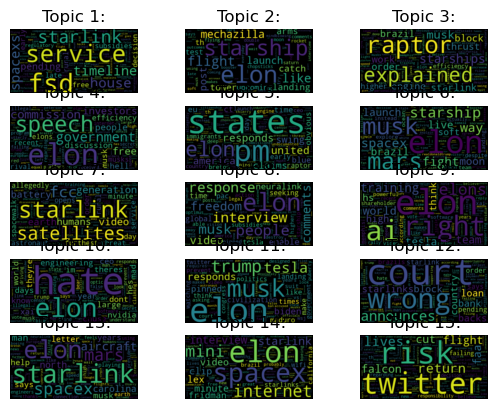

In [145]:
# display wordcloud
displayWordcloud(ldaModel, tfFeatureNames)

## EGONET

Without Restriction( Graph is cluttered)

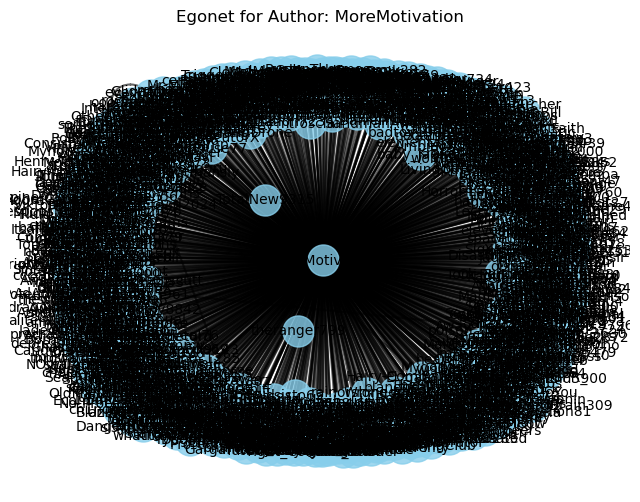

In [95]:
import json
import networkx as nx
import matplotlib.pyplot as plt

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Create a graph from the author-post relationships
def create_author_graph(data):
    G = nx.Graph()

    for post in data:
        post_author = post.get("author", "Unknown")
        
        # Add the post author as a node
        G.add_node(post_author, type="user")
        
        # Add edges between the post author and comment authors
        for comment in post.get("Comments", []):
            comment_author = comment.get("Comment_Author", "Unknown")
            
            # Add nodes for comment authors
            G.add_node(comment_author, type="user")

            # Add an edge between the post author and comment author
            G.add_edge(post_author, comment_author)

    return G

# Construct the egonet for a specific author
def construct_author_egonet(G, author):
    if author not in G:
        print(f"Author '{author}' not found in the graph.")
        return None

    # Get the ego network of the author (including their neighbors)
    egonet = nx.ego_graph(G, author)

    return egonet

# Visualize the egonet
def visualize_egonet(egonet, author):
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(egonet, k=0.5, iterations=20)

    # Draw nodes and edges
    nx.draw_networkx_nodes(egonet, pos, node_size=500, node_color='skyblue', alpha=0.8)
    nx.draw_networkx_edges(egonet, pos, width=1.5, alpha=0.6)
    nx.draw_networkx_labels(egonet, pos, font_size=10, font_color='black')

    # Add title
    plt.title(f"Egonet for Author: {author}")
    plt.axis('off')  # Hide axis
    plt.show()

# File path to your JSON file
file_path = "merged_json.json"

# Load the data
data = load_data(file_path)

# Create the author graph
G = create_author_graph(data)

# Specify the author to analyze
author = "MoreMotivation"  # Change this to any author in your data

# Construct the author's egonet
egonet = construct_author_egonet(G, author)

# Visualize the egonet if it exists
if egonet:
    visualize_egonet(egonet, author)
else:
    print(f"No egonet found for author: {author}")


JUST top 25 connection

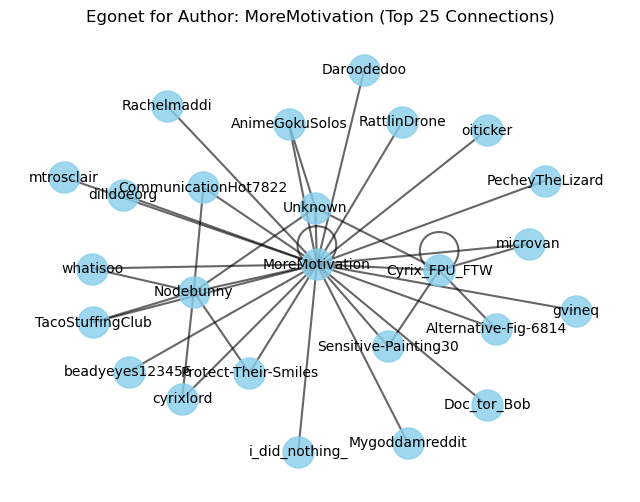

In [87]:
import json
import networkx as nx
import matplotlib.pyplot as plt

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Create a graph from the author-post relationships
def create_author_graph(data):
    G = nx.Graph()

    for post in data:
        post_author = post.get("author", "Unknown")
        
        # Add the post author as a node
        G.add_node(post_author, type="user")
        
        # Add edges between the post author and comment authors
        for comment in post.get("Comments", []):
            comment_author = comment.get("Comment_Author", "Unknown")
            
            # Add nodes for comment authors
            G.add_node(comment_author, type="user")

            # Add an edge between the post author and comment author
            G.add_edge(post_author, comment_author)

    return G

# Construct the egonet for a specific author, limited to top N connections
def construct_author_egonet(G, author, top_n=25):
    if author not in G:
        print(f"Author '{author}' not found in the graph.")
        return None

    # Get the ego network of the author (including their neighbors)
    egonet = nx.ego_graph(G, author)

    # Get top N neighbors based on the degree (number of connections)
    top_neighbors = sorted(egonet.neighbors(author), key=lambda n: egonet.degree(n), reverse=True)[:top_n]

    # Create a new subgraph with the author and the top N neighbors
    egonet = G.subgraph([author] + top_neighbors).copy()

    return egonet

# Visualize the egonet
def visualize_egonet(egonet, author):
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(egonet, k=0.5, iterations=20)

    # Draw nodes and edges
    nx.draw_networkx_nodes(egonet, pos, node_size=500, node_color='skyblue', alpha=0.8)
    nx.draw_networkx_edges(egonet, pos, width=1.5, alpha=0.6)
    nx.draw_networkx_labels(egonet, pos, font_size=10, font_color='black')

    # Add title
    plt.title(f"Egonet for Author: {author} (Top 25 Connections)")
    plt.axis('off')  # Hide axis
    plt.show()

# File path to your JSON file
file_path = "merged_json.json"

# Load the data
data = load_data(file_path)

# Create the author graph
G = create_author_graph(data)

# Specify the author to analyze
author = "MoreMotivation"  # Change this to any author in your data

# Construct the author's egonet with top 25 connections
egonet = construct_author_egonet(G, author, top_n=25)

# Visualize the egonet if it exists
if egonet:
    visualize_egonet(egonet, author)
else:
    print(f"No egonet found for author: {author}")


## Centrality ( For Particular Author)

Without Restriction

Centrality measures for 'MoreMotivation':
Degree Centrality: 0.0624
Closeness Centrality: 0.3490
Betweenness Centrality: 0.1243
Eigenvector Centrality: 0.7107


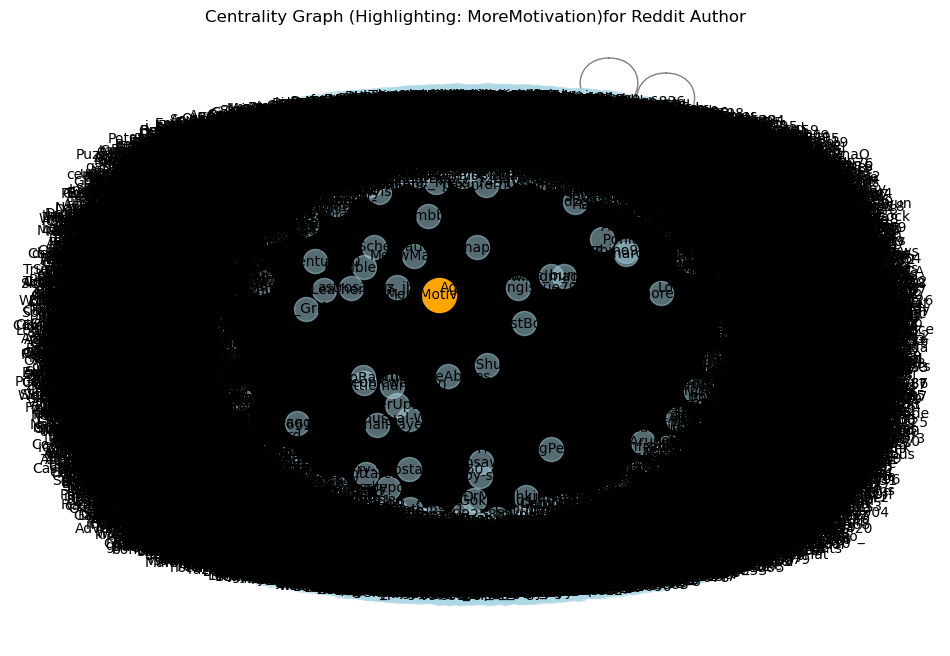

In [89]:
import json
import networkx as nx
import matplotlib.pyplot as plt

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Create a graph from the author-post relationships
def create_author_graph(data):
    G = nx.Graph()

    for post in data:
        post_author = post.get("author", "Unknown")
        
        # Add the post author as a node
        G.add_node(post_author, type="user")
        
        # Add edges between the post author and comment authors
        for comment in post.get("Comments", []):
            comment_author = comment.get("Comment_Author", "Unknown")
            
            # Add nodes for comment authors
            G.add_node(comment_author, type="user")

            # Add an edge between the post author and comment author
            G.add_edge(post_author, comment_author)

    return G

# Visualize the graph highlighting the specified author
def visualize_graph(G, author_to_analyze):
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, k=0.5, iterations=20)  # Positions for all nodes

    # Draw all nodes
    nx.draw_networkx_nodes(G, pos, node_size=300, node_color='lightblue', alpha=0.5)
    
    # Highlight the specified author
    nx.draw_networkx_nodes(G, pos, nodelist=[author_to_analyze], node_size=600, node_color='orange')
    
    # Draw edges
    nx.draw_networkx_edges(G, pos, width=1, alpha=0.5)
    
    # Draw labels
    nx.draw_networkx_labels(G, pos, font_size=10)
    
    plt.title(f"Centrality Graph (Highlighting: {author_to_analyze})for Reddit Author")
    plt.axis('off')  # Turn off the axis
    plt.show()

# File path to your JSON file
file_path = "data.json"

# Load the data
data = load_data(file_path)

# Create the author graph
G = create_author_graph(data)

# Specify the author whose centrality you want to measure and visualize
author_to_analyze = "MoreMotivation"  # Change this to the author you're interested in

# Check if the author exists in the graph
if author_to_analyze in G:
    # Calculate centrality measures for the specified author
    degree_centrality = nx.degree_centrality(G)[author_to_analyze]
    closeness_centrality = nx.closeness_centrality(G)[author_to_analyze]
    betweenness_centrality = nx.betweenness_centrality(G)[author_to_analyze]
    eigenvector_centrality = nx.eigenvector_centrality(G)[author_to_analyze]

    # Print the centrality measures for the specified author
    print(f"Centrality measures for '{author_to_analyze}':")
    print(f"Degree Centrality: {degree_centrality:.4f}")
    print(f"Closeness Centrality: {closeness_centrality:.4f}")
    print(f"Betweenness Centrality: {betweenness_centrality:.4f}")
    print(f"Eigenvector Centrality: {eigenvector_centrality:.4f}")

    # Visualize the graph
    visualize_graph(G, author_to_analyze)
else:
    print(f"Author '{author_to_analyze}' not found in the graph.")


Centrality With Restriction

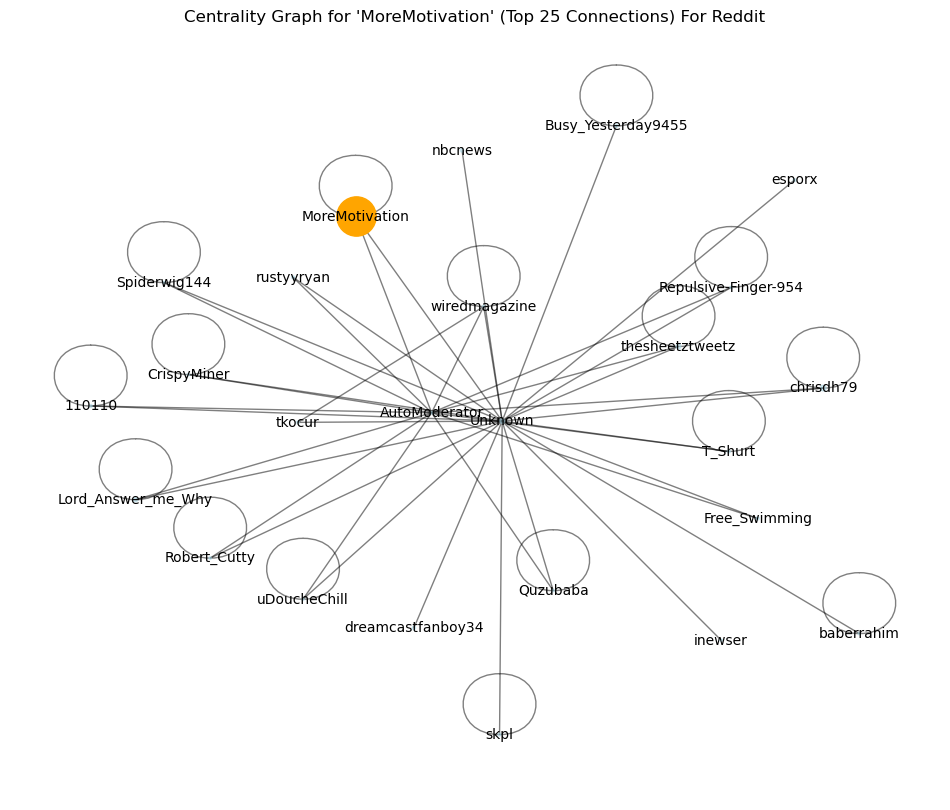

In [91]:
import json
import networkx as nx
import matplotlib.pyplot as plt

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Create a graph from the author-post relationships
def create_author_graph(data):
    G = nx.Graph()

    for post in data:
        post_author = post.get("author", "Unknown")
        
        # Add the post author as a node
        G.add_node(post_author, type="user")
        
        # Add edges between the post author and comment authors
        for comment in post.get("Comments", []):
            comment_author = comment.get("Comment_Author", "Unknown")
            
            # Add nodes for comment authors
            G.add_node(comment_author, type="user")

            # Add an edge between the post author and comment author
            G.add_edge(post_author, comment_author)

    return G

# Visualize the centrality graph for a specific author
def visualize_centrality_graph(G, author_to_analyze, top_n=25):
    # Calculate degree centrality
    centrality = nx.degree_centrality(G)

    # Get the top N nodes based on centrality
    top_nodes = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]

    # Create a subgraph with the author and their top centrality nodes
    ego_nodes = [author_to_analyze] + [node for node, _ in top_nodes if node != author_to_analyze]
    centrality_network = G.subgraph(ego_nodes).copy()

    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(centrality_network, k=0.5, iterations=20)  # Positions for all nodes

    # Draw all nodes
    node_sizes = [centrality[node] * 1000 for node in centrality_network.nodes()]  # Scale by centrality
    nx.draw_networkx_nodes(centrality_network, pos, node_size=node_sizes, node_color='lightblue', alpha=0.5)
    
    # Highlight the specified author
    nx.draw_networkx_nodes(centrality_network, pos, nodelist=[author_to_analyze], node_size=800, node_color='orange')
    
    # Draw edges
    nx.draw_networkx_edges(centrality_network, pos, width=1, alpha=0.5)
    
    # Draw labels
    nx.draw_networkx_labels(centrality_network, pos, font_size=10)
    
    plt.title(f"Centrality Graph for '{author_to_analyze}' (Top {top_n} Connections) For Reddit")
    plt.axis('off')  # Turn off the axis
    plt.show()
    
# File path to your- JSON file
file_path = "merged_json.json"

# Load the data
data = load_data(file_path)

# Create the author graph
G = create_author_graph(data)

# Specify the author whose centrality graph you want to visualize
author_to_analyze = "MoreMotivation"  # Change this to the author you're interested in

# Visualize the centrality graph for the specified author with limited connections
visualize_centrality_graph(G, author_to_analyze, top_n=25)


## Community Detection For Authors

Without Restriction

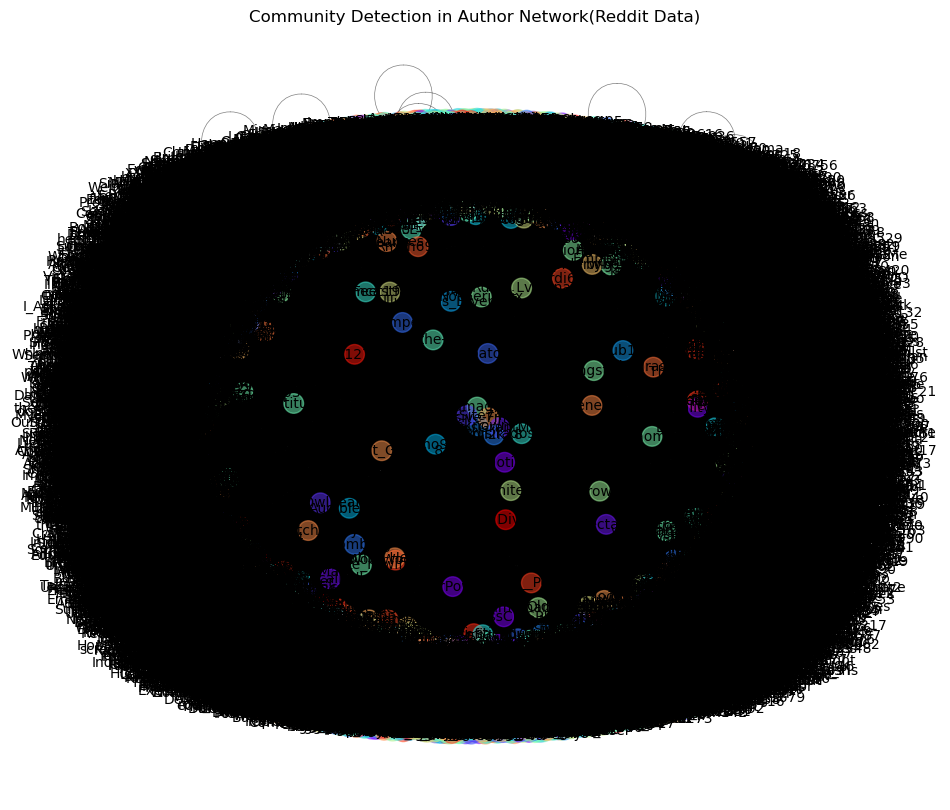

In [93]:
import json
import networkx as nx
import matplotlib.pyplot as plt
import community  # This requires the python-louvain package

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Create a graph from the author-post relationships
def create_author_graph(data):
    G = nx.Graph()

    for post in data:
        post_author = post.get("author", "Unknown")
        
        # Add the post author as a node
        G.add_node(post_author, type="user")
        
        # Add edges between the post author and comment authors
        for comment in post.get("Comments", []):
            comment_author = comment.get("Comment_Author", "Unknown")
            
            # Add nodes for comment authors
            G.add_node(comment_author, type="user")

            # Add an edge between the post author and comment author
            G.add_edge(post_author, comment_author)

    return G

# Detect communities using the Louvain method
def detect_communities(G):
    partition = community.best_partition(G)
    return partition

# Visualize the communities
def visualize_communities(G, partition):
    plt.figure(figsize=(12, 10))

    # Create a color map based on community membership
    color_map = [partition[node] for node in G.nodes()]
    
    # Draw the graph
    pos = nx.spring_layout(G, k=0.5, iterations=20)  # Positions for all nodes
    nx.draw_networkx_nodes(G, pos, node_size=200, node_color=color_map, cmap=plt.cm.rainbow, alpha=0.5)
    nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.5)
    nx.draw_networkx_labels(G, pos, font_size=10)

    plt.title("Community Detection in Author Network(Reddit Data)")
    plt.axis('off')  # Turn off the axis
    plt.show()

# File path to your JSON file
file_path = "data.json"

# Load the data
data = load_data(file_path)

# Create the author graph
G = create_author_graph(data)

# Detect communities
partition = detect_communities(G)

# Visualize the communities
visualize_communities(G, partition)


Top 

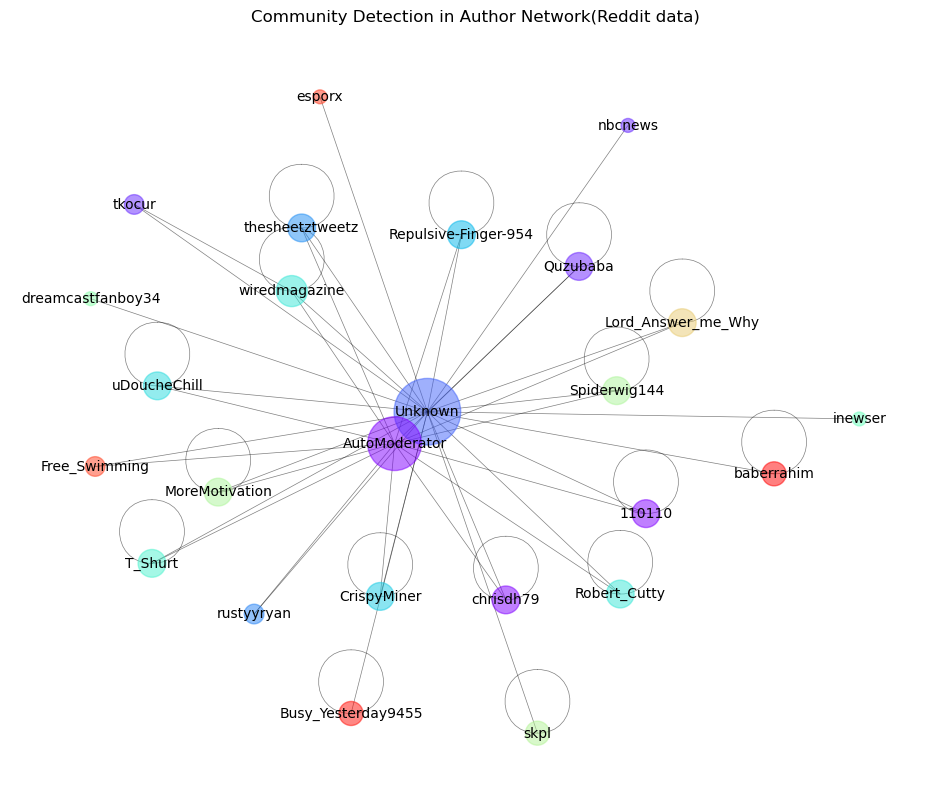

In [97]:
import json
import networkx as nx
import matplotlib.pyplot as plt
import community  # Requires python-louvain package

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Create a graph from the author-post relationships
def create_author_graph(data):
    G = nx.Graph()

    for post in data:
        post_author = post.get("author", "Unknown")
        G.add_node(post_author, type="user")

        # Add edges between the post author and comment authors
        for comment in post.get("Comments", []):
            comment_author = comment.get("Comment_Author", "Unknown")
            G.add_node(comment_author, type="user")
            G.add_edge(post_author, comment_author)

    return G

# Detect communities using the Louvain method
def detect_communities(G):
    partition = community.best_partition(G)
    return partition

# Filter the graph for better visualization
def filter_graph(G, top_n=25):
    # Get the top N nodes by degree centrality
    degrees = dict(G.degree())
    top_nodes = sorted(degrees, key=degrees.get, reverse=True)[:top_n]
    
    # Create a subgraph with top nodes
    subgraph = G.subgraph(top_nodes).copy()
    
    return subgraph

# Visualize the communities
def visualize_communities(G, partition):
    plt.figure(figsize=(12, 10))

    color_map = [partition[node] for node in G.nodes()]
    pos = nx.spring_layout(G, k=0.5, iterations=20)  # Positions for all nodes

    # Draw nodes with size based on degree
    node_sizes = [G.degree(node) * 100 for node in G.nodes()]  # Scale node size
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=color_map, cmap=plt.cm.rainbow, alpha=0.5)
    nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.5)
    nx.draw_networkx_labels(G, pos, font_size=10)

    plt.title("Community Detection in Author Network(Reddit data)")
    plt.axis('off')
    plt.show()

# File path to your JSON file
file_path = "merged_json.json"

# Load the data
data = load_data(file_path)

# Create the author graph
G = create_author_graph(data)

# Detect communities
partition = detect_communities(G)

# Filter the graph for better visualization
filtered_graph = filter_graph(G)

# Visualize the communities
visualize_communities(filtered_graph, partition)


## Co-Occurrence for Top 15 keywords

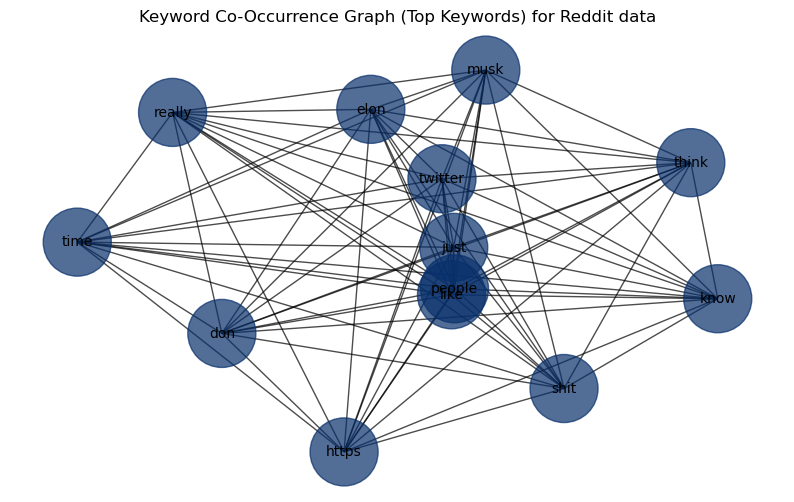

Top Words: ['like', 'just', 'elon', 'people', 'musk', 'tesla', 'twitter', 'don', 'https', 'time', 'space', 'trump', 'think', 'going', 'really', 'right', 'know', 'make', 'good', 'spacex', 'shit', 'com', 'comments', 'way', 'car', 'did', 'money', 'want', 'company', 'does', 'years', 've', 'thing', 'need', 'doesn', 'fuck', 'got', 'guy', 'new', 'actually', 'man', 'fucking', 'll', 'say', 'didn', 'isn', 'said', 'use', 'www', 'work', 'reddit', 'sure', 'usage', 'better', 'world', 'stub', 'lol', 'deleted', 'look', 'love', 'things', 'doing', 'looks', 'lot', 'let', 'point', 'day', 'probably', 'bad', 'buy', 'getting', 'hate', 'launch', 'used', 'cars', 'media', 'real', 'year', 'government', 'mean', 'long', 'rocket', 'pay', 'thought', 'trying', 'person', 'stop', 'free', 'post', 'maybe', 'great', 'model', 'pretty', 'news', 'needs', 'literally', 'starlink', 'using', 'hope', 'big']
Co-Occurrence Matrix:
 [[198125 166576 137195 ...  17661  17788  18270]
 [166576 181589 136048 ...  18927  16761  18179]
 [1

In [109]:
import json
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import random

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Sample the data to reduce processing time
def sample_data(data, sample_size=1000):
    return random.sample(data, min(sample_size, len(data)))

# Create a co-occurrence graph from keywords
def create_keyword_cooccurrence_graph(data):
    # Extract text for keyword analysis
    text_data = [post.get("title", "") + " " + " ".join(comment.get("Comment", "") for comment in post.get("Comments", [])) for post in data]
    
    # Create a CountVectorizer to get co-occurrence matrix
    vectorizer = CountVectorizer(stop_words='english', token_pattern=r'\b\w\w+\b')
    X = vectorizer.fit_transform(text_data)

    # Get the feature names and their corresponding counts
    feature_names = vectorizer.get_feature_names_out()
    word_counts = np.asarray(X.sum(axis=0)).flatten()

    # Create a dictionary of words and their counts
    word_count_dict = dict(zip(feature_names, word_counts))
    
    # Get the top 100 words by frequency
    top_words = sorted(word_count_dict, key=word_count_dict.get, reverse=True)[:100]

    # Filter the co-occurrence matrix to keep only top words
    top_word_indices = [feature_names.tolist().index(word) for word in top_words]
    cooccurrence_matrix = (X[:, top_word_indices].T @ X[:, top_word_indices]).toarray()

    # Debugging output
    print("Top Words:", top_words)
    print("Co-Occurrence Matrix:\n", cooccurrence_matrix)

    # Create a graph from the co-occurrence matrix
    G = nx.Graph()
    
    # Add edges based on co-occurrence
    for i in range(len(top_words)):
        for j in range(i + 1, len(top_words)):
            weight = cooccurrence_matrix[i][j]
            if weight > 0:  # Include only positive co-occurrences
                G.add_edge(top_words[i], top_words[j], weight=weight)

    print("Number of edges in the graph:", G.number_of_edges())

    return G

# Function to get color based on weight
def get_edge_color(weight, max_weight):
    # Normalize weight to a range of 0 to 1
    normalized_weight = weight / max_weight
    
    # Use a colormap for better visualization
    colormap = plt.colormaps['YlOrRd']  # Yellow to Red colormap
    return colormap(normalized_weight)

# Function to get node color based on degree
def get_node_color(degree, max_degree):
    # Normalize degree to a range of 0 to 1
    normalized_degree = degree / max_degree
    
    # Use a colormap for better visualization
    colormap = plt.colormaps['Blues']  # Blue colormap
    return colormap(normalized_degree)

def visualize_cooccurrence_graph(G, max_nodes=50, min_edge_weight=2):
    # Limit to top N nodes
    if len(G.nodes()) > max_nodes:
        # Sort nodes by degree and take the top N nodes
        top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:max_nodes]
        top_nodes = [node for node, _ in top_nodes]
        G = G.subgraph(top_nodes).copy()  # Create a subgraph with only top nodes

    plt.figure(figsize=(10, 6), facecolor='white')
    
    # Draw the graph with node sizes based on degree centrality
    node_sizes = [200 * G.degree(node) for node in G.nodes()]
    pos = nx.spring_layout(G, k=0.5, iterations=50)

    # Get max weight for edge color mapping
    max_weight = max([data['weight'] for _, _, data in G.edges(data=True)]) if G.edges else 1
    
    # Draw edges with varying colors based on weight, filtered by minimum weight
    edges = G.edges(data=True)
    edge_colors = [get_edge_color(edge[2]['weight'], max_weight) for edge in edges if edge[2]['weight'] >= min_edge_weight]
    
    # Draw edges that meet the minimum weight requirement
    filtered_edges = [(u, v) for u, v, d in edges if d['weight'] >= min_edge_weight]
    
    nx.draw_networkx_edges(G, pos, edgelist=filtered_edges, edge_color='black', alpha=0.7)
    
    # Draw nodes with varying colors based on degree
    max_degree = max(dict(G.degree()).values()) if G.nodes else 1  # Avoid division by zero
    node_colors = [get_node_color(G.degree(node), max_degree) for node in G.nodes()]
    
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.7)
    nx.draw_networkx_labels(G, pos, font_size=10)

    plt.title("Keyword Co-Occurrence Graph (Top Keywords) for Reddit data")
    plt.axis('off')  # Turn off the axis
    plt.show()

# Use this function to visualize the graph
visualize_cooccurrence_graph(cooccurrence_graph, max_nodes=13, min_edge_weight=2)

# File path to your JSON file
file_path = "merged_json.json"

# Load the data and sample it
data = load_data(file_path)
sampled_data = sample_data(data, sample_size=1000)

# Create the keyword co-occurrence graph
cooccurrence_graph = create_keyword_cooccurrence_graph(sampled_data)




Top Words: ['elon', 'musk', 'like', 'just', 'people', 'trump', 'twitter', 'tesla', 'don', 'right', 'time', 'think', 'going', 'shit', 'money', 'https', 'know', 'really', 'guy', 'good', 'fuck', 'man', 'make', 'fucking', 'does', 'want', 'doesn', 'did', 'way', 'company', 'com', 'said', 'years', 'say', 'world', 'thing', 'media', 'actually', 'need', 'got', 'didn', 'government', 'vote', 've', 'hate', 'buy', 'll', 'isn', 'let', 'sure', 'speech', 'rich', 'doing', 'www', 'weird', 'wants', 'needs', 'stop', 'lol', 'reddit', 'point', 'election', 'look', 'new', 'trying', 'love', 'person', 'social', 'gif', 'bought', 'use', 'platform', 'free', 'day', 'car', 'getting', 'mean', 'bad', 'news', 'things', 'probably', 'using', 'better', 'giphy', 'saying', 'literally', 'thought', 'hope', 'real', 'pay', 'work', 'believe', 'white', 'cars', 'harris', 'left', 'used', 'post', 'country', 'looks']
Co-Occurrence Matrix:
 [[61825 47468 38260 ...  4229  4109  3623]
 [47468 46477 31447 ...  3627  3793  2588]
 [38260 31

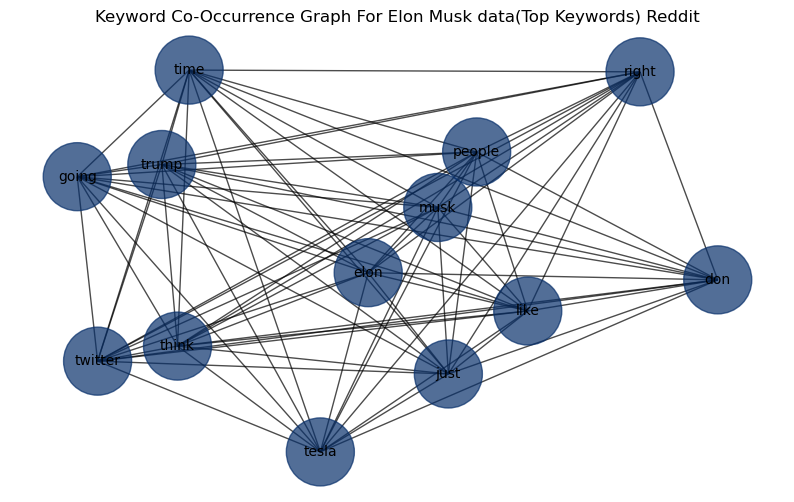

In [111]:
import json
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import random

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Sample the data to reduce processing time
def sample_data(data, sample_size=1000):
    return random.sample(data, min(sample_size, len(data)))

# Create a co-occurrence graph from keywords
def create_keyword_cooccurrence_graph(data):
    text_data = [
        post.get("title", "") + " " + 
        " ".join(comment.get("Comment", "") for comment in post.get("Comments", [])) 
        for post in data
    ]
    
    vectorizer = CountVectorizer(stop_words='english', token_pattern=r'\b\w\w+\b')
    X = vectorizer.fit_transform(text_data)

    feature_names = vectorizer.get_feature_names_out()
    word_counts = np.asarray(X.sum(axis=0)).flatten()

    word_count_dict = dict(zip(feature_names, word_counts))
    top_words = sorted(word_count_dict, key=word_count_dict.get, reverse=True)[:100]

    top_word_indices = [feature_names.tolist().index(word) for word in top_words]
    cooccurrence_matrix = (X[:, top_word_indices].T @ X[:, top_word_indices]).toarray()

    print("Top Words:", top_words)
    print("Co-Occurrence Matrix:\n", cooccurrence_matrix)

    G = nx.Graph()
    for i in range(len(top_words)):
        for j in range(i + 1, len(top_words)):
            weight = cooccurrence_matrix[i][j]
            if weight > 0:
                G.add_edge(top_words[i], top_words[j], weight=weight)

    print("Number of edges in the graph:", G.number_of_edges())
    return G

def get_edge_color(weight, max_weight):
    normalized_weight = weight / max_weight
    colormap = plt.colormaps['YlOrRd']
    return colormap(normalized_weight)

def get_node_color(degree, max_degree):
    normalized_degree = degree / max_degree
    colormap = plt.colormaps['Blues']
    return colormap(normalized_degree)

def visualize_cooccurrence_graph(G, max_nodes=50, min_edge_weight=2):
    if len(G.nodes()) > max_nodes:
        top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:max_nodes]
        top_nodes = [node for node, _ in top_nodes]
        G = G.subgraph(top_nodes).copy()

    plt.figure(figsize=(10, 6), facecolor='white')

    node_sizes = [200 * G.degree(node) for node in G.nodes()]
    pos = nx.spring_layout(G, k=0.5, iterations=50)

    max_weight = max([data['weight'] for _, _, data in G.edges(data=True)]) if G.edges else 1
    edges = G.edges(data=True)
    edge_colors = [get_edge_color(edge[2]['weight'], max_weight) for edge in edges if edge[2]['weight'] >= min_edge_weight]
    filtered_edges = [(u, v) for u, v, d in edges if d['weight'] >= min_edge_weight]
    
    nx.draw_networkx_edges(G, pos, edgelist=filtered_edges, edge_color='black', alpha=0.7)

    max_degree = max(dict(G.degree()).values()) if G.nodes else 1
    node_colors = [get_node_color(G.degree(node), max_degree) for node in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.7)
    nx.draw_networkx_labels(G, pos, font_size=10)

    plt.title("Keyword Co-Occurrence Graph For Elon Musk data(Top Keywords) Reddit")
    plt.axis('off')
    plt.show()

# File path to your JSON file
file_path = "elon_musk_data.json"

# Load the data and sample it
data = load_data(file_path)
sampled_data = sample_data(data, sample_size=1000)

# Create the keyword co-occurrence graph
cooccurrence_graph = create_keyword_cooccurrence_graph(sampled_data)

# Visualize the graph
visualize_cooccurrence_graph(cooccurrence_graph, max_nodes=13, min_edge_weight=2)


Top Words: ['space', 'spacex', 'like', 'just', 'comments', 'elon', 'usage', 'stub', 'people', 'launch', 'musk', 'rocket', 'https', 'don', 'time', 'starlink', 'going', 'think', 'company', 'really', 'nasa', 'know', 'way', 'make', 'good', 'com', 'orbit', 'need', 'did', 'starship', 'right', 'work', 'landing', 'thing', 'boeing', 'years', 've', 'money', 'internet', 'shit', 'want', 'does', 'earth', 'got', 'new', 'flight', 'use', 'lot', 'things', 'actually', 'didn', 'doesn', 'removed', 'land', 'll', 'government', 'www', 'rockets', 'satellites', 'isn', 'companies', 'doing', 'deleted', 'booster', 'engine', 'test', 'better', 'world', 'sure', 'moon', 'used', 'long', 'probably', 'said', 'engines', 'say', 'pretty', 'service', 'look', 'org', 'fuck', 'reddit', 'big', 'day', 'point', 'wiki', 'satellite', 'great', 'wikipedia', 'fucking', 'en', 'bad', 'real', 'seen', 'twitter', 'cool', 'amazing', 'getting', 'mars', 'crew']
Co-Occurrence Matrix:
 [[153796  72349  54900 ...   7109   8944  10702]
 [ 72349  

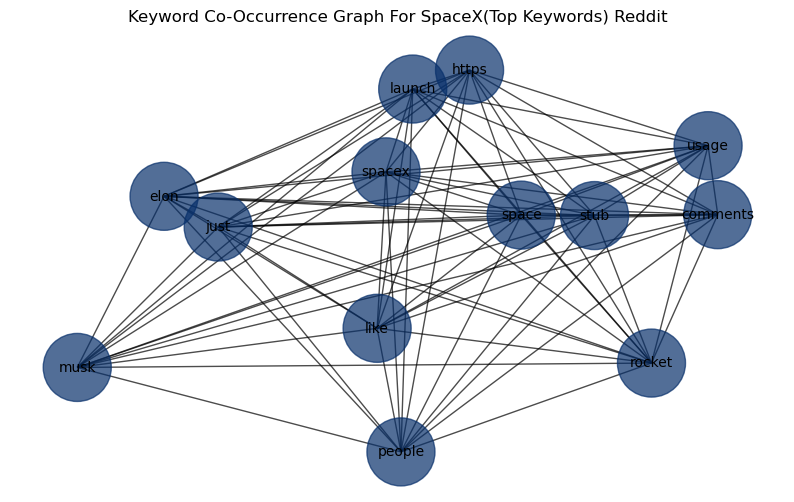

In [113]:
import json
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import random

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Sample the data to reduce processing time
def sample_data(data, sample_size=1000):
    return random.sample(data, min(sample_size, len(data)))

# Create a co-occurrence graph from keywords
def create_keyword_cooccurrence_graph(data):
    text_data = [
        post.get("title", "") + " " + 
        " ".join(comment.get("Comment", "") for comment in post.get("Comments", [])) 
        for post in data
    ]
    
    vectorizer = CountVectorizer(stop_words='english', token_pattern=r'\b\w\w+\b')
    X = vectorizer.fit_transform(text_data)

    feature_names = vectorizer.get_feature_names_out()
    word_counts = np.asarray(X.sum(axis=0)).flatten()

    word_count_dict = dict(zip(feature_names, word_counts))
    top_words = sorted(word_count_dict, key=word_count_dict.get, reverse=True)[:100]

    top_word_indices = [feature_names.tolist().index(word) for word in top_words]
    cooccurrence_matrix = (X[:, top_word_indices].T @ X[:, top_word_indices]).toarray()

    print("Top Words:", top_words)
    print("Co-Occurrence Matrix:\n", cooccurrence_matrix)

    G = nx.Graph()
    for i in range(len(top_words)):
        for j in range(i + 1, len(top_words)):
            weight = cooccurrence_matrix[i][j]
            if weight > 0:
                G.add_edge(top_words[i], top_words[j], weight=weight)

    print("Number of edges in the graph:", G.number_of_edges())
    return G

def get_edge_color(weight, max_weight):
    normalized_weight = weight / max_weight
    colormap = plt.colormaps['YlOrRd']
    return colormap(normalized_weight)

def get_node_color(degree, max_degree):
    normalized_degree = degree / max_degree
    colormap = plt.colormaps['Blues']
    return colormap(normalized_degree)

def visualize_cooccurrence_graph(G, max_nodes=50, min_edge_weight=2):
    if len(G.nodes()) > max_nodes:
        top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:max_nodes]
        top_nodes = [node for node, _ in top_nodes]
        G = G.subgraph(top_nodes).copy()

    plt.figure(figsize=(10, 6), facecolor='white')

    node_sizes = [200 * G.degree(node) for node in G.nodes()]
    pos = nx.spring_layout(G, k=0.5, iterations=50)

    max_weight = max([data['weight'] for _, _, data in G.edges(data=True)]) if G.edges else 1
    edges = G.edges(data=True)
    edge_colors = [get_edge_color(edge[2]['weight'], max_weight) for edge in edges if edge[2]['weight'] >= min_edge_weight]
    filtered_edges = [(u, v) for u, v, d in edges if d['weight'] >= min_edge_weight]
    
    nx.draw_networkx_edges(G, pos, edgelist=filtered_edges, edge_color='black', alpha=0.7)

    max_degree = max(dict(G.degree()).values()) if G.nodes else 1
    node_colors = [get_node_color(G.degree(node), max_degree) for node in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.7)
    nx.draw_networkx_labels(G, pos, font_size=10)

    plt.title("Keyword Co-Occurrence Graph For SpaceX(Top Keywords) Reddit")
    plt.axis('off')
    plt.show()

# File path to your JSON file
file_path = "SpaceX_data.json"

# Load the data and sample it
data = load_data(file_path)
sampled_data = sample_data(data, sample_size=1000)

# Create the keyword co-occurrence graph
cooccurrence_graph = create_keyword_cooccurrence_graph(sampled_data)

# Visualize the graph
visualize_cooccurrence_graph(cooccurrence_graph, max_nodes=13, min_edge_weight=2)


Top Words: ['tesla', 'like', 'just', 'car', 'people', 'elon', 'don', 'https', 'model', 'time', 'going', 'cars', 'think', 'com', 'really', 'new', 'make', 'good', 'company', 've', 'years', 'fsd', 'teslamotors', 'need', 'know', 'want', 'way', 'musk', 'looks', 'price', 'comments', 'driving', 'does', 'right', 'work', 'got', 'did', 'll', 'www', 'deleted', 'thing', 'better', 'use', 'buy', 'doesn', 'drive', 'year', 'reddit', 'actually', 'pay', 'battery', 'truck', 'money', 'sure', 'lot', 'look', 'didn', 'ev', 'isn', 'lol', 'long', 'vehicle', 'love', 'gas', 'probably', 'used', 'shit', 'charge', 'getting', 'day', 'maybe', 'charging', '10', 'bad', 'stock', 'point', 'said', 'things', 'wait', 'usage', 'power', 'pretty', 'say', 'electric', 'autopilot', 'miles', 'range', 'let', 'guy', 'great', 'stub', 'support', 'doing', 'big', 'sub', 'driver', 'real', '100', 'road', 'twitter']
Co-Occurrence Matrix:
 [[149249  59524  60524 ...   8000   5971   8378]
 [ 59524  41218  33300 ...   3920   4054   4108]
 [ 6

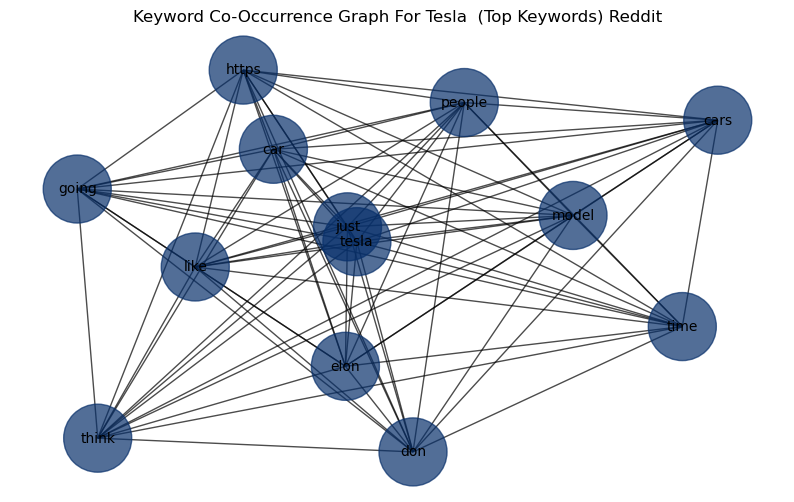

In [115]:
import json
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import random

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Sample the data to reduce processing time
def sample_data(data, sample_size=1000):
    return random.sample(data, min(sample_size, len(data)))

# Create a co-occurrence graph from keywords
def create_keyword_cooccurrence_graph(data):
    text_data = [
        post.get("title", "") + " " + 
        " ".join(comment.get("Comment", "") for comment in post.get("Comments", [])) 
        for post in data
    ]
    
    vectorizer = CountVectorizer(stop_words='english', token_pattern=r'\b\w\w+\b')
    X = vectorizer.fit_transform(text_data)

    feature_names = vectorizer.get_feature_names_out()
    word_counts = np.asarray(X.sum(axis=0)).flatten()

    word_count_dict = dict(zip(feature_names, word_counts))
    top_words = sorted(word_count_dict, key=word_count_dict.get, reverse=True)[:100]

    top_word_indices = [feature_names.tolist().index(word) for word in top_words]
    cooccurrence_matrix = (X[:, top_word_indices].T @ X[:, top_word_indices]).toarray()

    print("Top Words:", top_words)
    print("Co-Occurrence Matrix:\n", cooccurrence_matrix)

    G = nx.Graph()
    for i in range(len(top_words)):
        for j in range(i + 1, len(top_words)):
            weight = cooccurrence_matrix[i][j]
            if weight > 0:
                G.add_edge(top_words[i], top_words[j], weight=weight)

    print("Number of edges in the graph:", G.number_of_edges())
    return G

def get_edge_color(weight, max_weight):
    normalized_weight = weight / max_weight
    colormap = plt.colormaps['YlOrRd']
    return colormap(normalized_weight)

def get_node_color(degree, max_degree):
    normalized_degree = degree / max_degree
    colormap = plt.colormaps['Blues']
    return colormap(normalized_degree)

def visualize_cooccurrence_graph(G, max_nodes=50, min_edge_weight=2):
    if len(G.nodes()) > max_nodes:
        top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:max_nodes]
        top_nodes = [node for node, _ in top_nodes]
        G = G.subgraph(top_nodes).copy()

    plt.figure(figsize=(10, 6), facecolor='white')

    node_sizes = [200 * G.degree(node) for node in G.nodes()]
    pos = nx.spring_layout(G, k=0.5, iterations=50)

    max_weight = max([data['weight'] for _, _, data in G.edges(data=True)]) if G.edges else 1
    edges = G.edges(data=True)
    edge_colors = [get_edge_color(edge[2]['weight'], max_weight) for edge in edges if edge[2]['weight'] >= min_edge_weight]
    filtered_edges = [(u, v) for u, v, d in edges if d['weight'] >= min_edge_weight]
    
    nx.draw_networkx_edges(G, pos, edgelist=filtered_edges, edge_color='black', alpha=0.7)

    max_degree = max(dict(G.degree()).values()) if G.nodes else 1
    node_colors = [get_node_color(G.degree(node), max_degree) for node in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.7)
    nx.draw_networkx_labels(G, pos, font_size=10)

    plt.title("Keyword Co-Occurrence Graph For Tesla  (Top Keywords) Reddit")
    plt.axis('off')
    plt.show()

# File path to your JSON file
file_path = "Tesla_data.json"

# Load the data and sample it
data = load_data(file_path)
sampled_data = sample_data(data, sample_size=1000)

# Create the keyword co-occurrence graph
cooccurrence_graph = create_keyword_cooccurrence_graph(sampled_data)

# Visualize the graph
visualize_cooccurrence_graph(cooccurrence_graph, max_nodes=13, min_edge_weight=2)


Top Words: ['twitter', 'like', 'just', 'people', 'don', 'elon', 'think', 'https', 'know', 'musk', 'time', 'really', 'shit', 'make', 'right', 'going', 'good', 'way', 've', 'did', 'want', 'fucking', 'fuck', 'say', 'got', 'thing', 'actually', 'guy', 'com', 'post', 'love', 'does', 'isn', 'doesn', 'didn', 'll', 'man', 'lol', 'years', 'trump', 'reddit', 'money', 'new', 'media', 'need', 'bad', 'mean', 'better', 'use', 'redd', 'day', 'real', 'said', 'account', 'auto', 'format', 'person', 'hate', 'game', 'point', 'preview', 'look', 'webp', 'width', 'let', 'social', 'probably', 'sure', 'deleted', 'things', 'literally', 'world', 'stupid', 'stop', 'getting', 'pjpg', 'lot', 'thought', 'saying', 'free', 'using', 'doing', 'platform', 'jpeg', 'left', 'understand', 'looks', 'trying', 'used', 'white', 'old', 'fact', 'makes', 'oh', 'life', 'gonna', 'www', 'feel', 'long', 'black']
Co-Occurrence Matrix:
 [[169717  36228  45731 ...   2931   4533   2580]
 [ 36228  45257  39765 ...   4508   3862   3653]
 [ 45

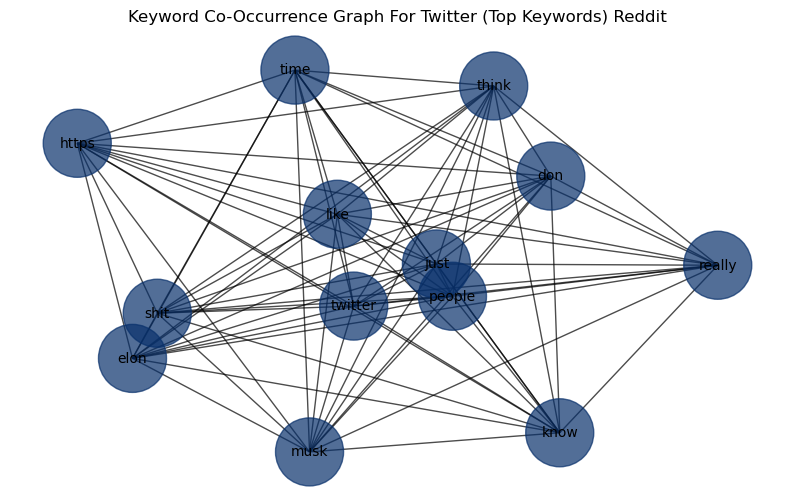

In [117]:
import json
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import random

# Load data from the JSON file
def load_data(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    return data["submission"]

# Sample the data to reduce processing time
def sample_data(data, sample_size=1000):
    return random.sample(data, min(sample_size, len(data)))

# Create a co-occurrence graph from keywords
def create_keyword_cooccurrence_graph(data):
    text_data = [
        post.get("title", "") + " " + 
        " ".join(comment.get("Comment", "") for comment in post.get("Comments", [])) 
        for post in data
    ]
    
    vectorizer = CountVectorizer(stop_words='english', token_pattern=r'\b\w\w+\b')
    X = vectorizer.fit_transform(text_data)

    feature_names = vectorizer.get_feature_names_out()
    word_counts = np.asarray(X.sum(axis=0)).flatten()

    word_count_dict = dict(zip(feature_names, word_counts))
    top_words = sorted(word_count_dict, key=word_count_dict.get, reverse=True)[:100]

    top_word_indices = [feature_names.tolist().index(word) for word in top_words]
    cooccurrence_matrix = (X[:, top_word_indices].T @ X[:, top_word_indices]).toarray()

    print("Top Words:", top_words)
    print("Co-Occurrence Matrix:\n", cooccurrence_matrix)

    G = nx.Graph()
    for i in range(len(top_words)):
        for j in range(i + 1, len(top_words)):
            weight = cooccurrence_matrix[i][j]
            if weight > 0:
                G.add_edge(top_words[i], top_words[j], weight=weight)

    print("Number of edges in the graph:", G.number_of_edges())
    return G

def get_edge_color(weight, max_weight):
    normalized_weight = weight / max_weight
    colormap = plt.colormaps['YlOrRd']
    return colormap(normalized_weight)

def get_node_color(degree, max_degree):
    normalized_degree = degree / max_degree
    colormap = plt.colormaps['Blues']
    return colormap(normalized_degree)

def visualize_cooccurrence_graph(G, max_nodes=50, min_edge_weight=2):
    if len(G.nodes()) > max_nodes:
        top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:max_nodes]
        top_nodes = [node for node, _ in top_nodes]
        G = G.subgraph(top_nodes).copy()

    plt.figure(figsize=(10, 6), facecolor='white')

    node_sizes = [200 * G.degree(node) for node in G.nodes()]
    pos = nx.spring_layout(G, k=0.5, iterations=50)

    max_weight = max([data['weight'] for _, _, data in G.edges(data=True)]) if G.edges else 1
    edges = G.edges(data=True)
    edge_colors = [get_edge_color(edge[2]['weight'], max_weight) for edge in edges if edge[2]['weight'] >= min_edge_weight]
    filtered_edges = [(u, v) for u, v, d in edges if d['weight'] >= min_edge_weight]
    
    nx.draw_networkx_edges(G, pos, edgelist=filtered_edges, edge_color='black', alpha=0.7)

    max_degree = max(dict(G.degree()).values()) if G.nodes else 1
    node_colors = [get_node_color(G.degree(node), max_degree) for node in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.7)
    nx.draw_networkx_labels(G, pos, font_size=10)

    plt.title("Keyword Co-Occurrence Graph For Twitter (Top Keywords) Reddit")
    plt.axis('off')
    plt.show()

# File path to your JSON file
file_path = "twitter_data.json"

# Load the data and sample it
data = load_data(file_path)
sampled_data = sample_data(data, sample_size=1000)

# Create the keyword co-occurrence graph
cooccurrence_graph = create_keyword_cooccurrence_graph(sampled_data)

# Visualize the graph
visualize_cooccurrence_graph(cooccurrence_graph, max_nodes=13, min_edge_weight=2)
